# Transformed data analysis

In [33]:
import pyarrow as pa
import pyarrow.parquet as pq

phishing = pq.read_table('floor/phishing_2307.parquet')
benign = pq.read_table('floor/benign_2307.parquet')

In [34]:
from transformers.drop_nontrain import drop_nontrain_table as drop_nontrain
phishing = drop_nontrain(phishing)
benign = drop_nontrain(benign)

# realign schemas (parquet files save in nonsense orders)
benign = benign.cast(phishing.schema)

# concatentate tables
data = pa.concat_tables([phishing, benign])
df = data.to_pandas()

benign = benign.to_pandas()
phishing = phishing.to_pandas()

from transformers.cast_timestamp import cast_timestamp
df = cast_timestamp(df)
benign = cast_timestamp(benign)
phishing = cast_timestamp(phishing)

# Handle NaNs
df.fillna(-1, inplace=True)
benign.fillna(-1, inplace=True)
phishing.fillna(-1, inplace=True)

In [35]:
def data_sample(n=1000):
    return [benign.sample(n), phishing.sample(n)]

## Let's do some basic analysis

In [36]:
%matplotlib widget
# %matplotlib notebook
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np
from tqdm import tqdm

In [53]:
def base_quocients_iterator(quocient_evaluator, df1, df2):
    column_quocients = {}
    pbar = tqdm(total=len(df1.columns), desc="Processing")
    for column in df1.columns:
        column_quocients[column] = quocient_evaluator(column, df1, df2)
        pbar.update(1)
    return column_quocients

def get_column_quotients(quocient_evaluator, iterator, sample_n=None, sample_frac=0.5, df1=None, df2=None):
    sample_params = {"n": sample_n} if sample_n else {"frac": sample_frac}

    if df1 is not None:
        s_benign = df1
    else:
        s_benign = benign.sample(**sample_params)

    if df2 is not None:
        s_phishing = df2
    else:
        s_phishing = phishing.sample(**sample_params)

    column_quotients = iterator(quocient_evaluator, s_benign, s_phishing)

    return column_quotients


### Finding features most differing in distribution

In [ ]:
def distribution_difference(column_name, benign, phishing):
        # Check if the data type of the column is numeric (excluding strings)
        if pd.api.types.is_numeric_dtype(benign[column_name]) and pd.api.types.is_numeric_dtype(phishing[column_name]):
            # Extract the specific column data
            col_benign = benign[column_name].values
            col_phishing = phishing[column_name].values
            
            # Calculate unique value counts for both arrays
            unique_benign, counts_benign = np.unique(col_benign, return_counts=True)
            unique_phishing, counts_phishing = np.unique(col_phishing, return_counts=True)
            
            # Normalize the counts
            normalized_counts_benign = counts_benign / counts_benign.sum() * 100
            normalized_counts_phishing = counts_phishing / counts_phishing.sum() * 100
            
            # Combine unique values and handle differences
            all_uniques = np.union1d(unique_benign, unique_phishing)
            
            # Initialize final counts for both classes
            final_benign = np.zeros_like(all_uniques, dtype=np.float64)
            final_phishing = np.zeros_like(all_uniques, dtype=np.float64)
            
            # Populate final counts based on unique values in both arrays
            for i, value in enumerate(all_uniques):
                if value in unique_benign:
                    index_benign = np.where(unique_benign == value)[0]
                    final_benign[i] = normalized_counts_benign[index_benign]
            
                if value in unique_phishing:
                    index_phishing = np.where(unique_phishing == value)[0]
                    final_phishing[i] = normalized_counts_phishing[index_phishing]
            
            return np.sum(abs(final_benign - final_phishing))
        else:
            return -1  # or handle non-numeric features as needed

# Define a list of column names with the 'rdap_' prefix
rdap_columns = [col for col in df.columns if col.startswith('rdap_')]
# Create a boolean mask for rows where any 'rdap_' column is not equal to 0
mask = (df[rdap_columns] != 0).any(axis=1)
# Use the mask to filter the DataFrame and keep only rows where the condition is met
rn_benign = benign[mask]
rn_phishing = phishing[mask]



column_quotients = get_column_quotients(distribution_difference, base_quocients_iterator, df1=rn_benign, df2=rn_phishing)
column_quotients = {k: v for k, v in sorted(column_quocients.items(), key=lambda item: item[1])}

[print(x, y) for x,y in column_quotients.items()]

# Create a new DataFrame with columns sorted according to the custom function
df = df[sorted_columns]
benign = benign[sorted_columns]
phishing = phishing[sorted_columns]

# value_counts()

C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_2508\414798243.py:42: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rn_benign = benign[mask]
C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_2508\414798243.py:43: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  rn_phishing = phishing[mask]

Processing:   0%|                                                                                                             | 0/129 [00:00<?, ?it/s]C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_2508\414798243.py:27: DeprecationWarning: Conversion of an array with ndim > 0 to a scalar is deprecated, and will error in future. Ensure you extract a single element from your array before performing this operation. (Deprecated NumPy 1.25.)
  final_benign[i] = normalized_counts_benign[index_benign]
C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_2508\414798243.py:31: DeprecationWarning: Conversion of an array with ndim > 0 to a scala

In [42]:
sorted_columns = column_quocients.keys()
sorted_columns

dict_keys(['label', 'dns_txt_dmarc_exists', 'rdap_admin_email_len', 'rdap_has_dnssec', 'rdap_admin_name_len', 'lex_begins_with_digit', 'rdap_admin_name_entropy', 'lex_www_flag', 'dns_domain_name_in_mx', 'dns_txt_spf_exists', 'dns_zone_digit_count', 'dns_txt_dkim_exists', 'tls_expired_chain', 'tls_has_tls', 'tls_broken_chain', 'lex_sub_max_consonant_len', 'ip_v4_ratio', 'tls_iso_policy_crt_count', 'dns_MX_count', 'dns_mx_avg_len', 'dns_TXT_count', 'dns_ttl_distinct_count', 'tls_percentage_crt_with_policies', 'tls_server_auth_crt_count', 'dns_AAAA_count', 'dns_SOA_count', 'dns_NS_count', 'dns_A_count', 'dns_zone_level', 'lex_has_digit', 'tls_negotiated_version_id', 'lex_tld_len', 'lex_sub_count', 'dns_mx_avg_entropy', 'dns_CNAME_count', 'tls_unique_SLD_count', 'tls_client_auth_crt_count', 'dns_txt_avg_entropy', 'lex_sub_consonant_count', 'dns_has_dnskey', 'lex_sub_digit_count', 'dns_ttl_low', 'dns_dnssec_score', 'ip_asn_entropy', 'ip_distinct_as_count', 'lex_sub_non_alphanum_count', 'ip_

In [ ]:
sb, sp = data_sample()

# Loop through the columns in groups of 5
columns_per_plot = 4
for i in range(0, len(df.columns), columns_per_plot):
    subset_columns = df.columns[i:i+columns_per_plot]  # Get a subset of columns

    plt.figure(figsize=(15, 2.5))  # Set the figure size
    for j, column in enumerate(subset_columns):
        try:
            plt.subplot(1, columns_per_plot, j + 1)  # Create subplots
            sns.histplot(sb[column], kde=True, bins=20, stat='density', label="benign")
            sns.histplot(sp[column], kde=True, bins=20, stat='density', label="phishing")
            plt.title(f'{column}')
            # plt.xlabel(column)
            # plt.ylabel('Probability Density')
            plt.legend()
            # print(column, distribution_difference(column))
        except:
            pass

    plt.tight_layout()  # Ensure subplots don't overlap
    plt.show()

In [ ]:
def data_sample(n=500):
    return [benign.sample(n), phishing.sample(n)]

### Let's see, if there are any interesting patterns / correlations between features...

In [ ]:
import seaborn as sns
import matplotlib.pyplot as plt
import pandas as pd
import random

features = benign.columns
feature_combinations = [(feat1, feat2) for feat1 in features for feat2 in features if ((feat1 != feat2) and (feat1 != "label" or feat2 != "label"))]
filtered_comb = []

for (feat1, feat2) in feature_combinations:
    if not ((feat1, feat2) in filtered_comb or (feat2, feat1) in filtered_comb):
        filtered_comb.append((feat1, feat2))

# Number of rows and columns in the grid
num_cols = 4
num_rows = 4
# Create a grid of subplots
plt.clf()
fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
j = 0

# Iterate through feature combinations and create scatter plots
for i, (feature_a, feature_b) in enumerate(feature_combinations):
    if (i // (num_cols*num_rows)) > j:
        j = (i // (num_cols*num_rows))
        plt.tight_layout()
        plt.show()
        plt.clf()
        print(i / len(feature_combinations))
        fig, axes = plt.subplots(num_rows, num_cols, figsize=(15, 15))
        
    try:
        ii = i % (num_cols*num_rows)
        s_benign, s_phishing = data_sample()
        row, col = divmod(ii, num_rows)
        ax = axes[row, col]

        # Scatter plots
        ax.scatter(s_phishing[feature_a], s_phishing[feature_b], label="phishing", c="red", marker="o")
        ax.scatter(s_benign[feature_a], s_benign[feature_b], label="benign", c="blue", marker="x")

        # Labeling and legend for each subplot
        ax.set_xlabel(feature_a)
        ax.set_ylabel(feature_b)
        ax.legend()
    except:
        pass

# Adjust layout and display the grid of plots
plt.tight_layout()
plt.show()

### Kernel Density Estimation overlap

In [6]:
from sklearn.neighbors import KernelDensity
import concurrent.futures

In [ ]:
def kernel_overlap(column_a, column_b, df1, df2, bandwidth=0.3, grid_resolution=100):
    if pd.api.types.is_numeric_dtype(df1[column_a]) and pd.api.types.is_numeric_dtype(df1[column_b]):
        df1 = df1[[column_a, column_b]]
        df2 = df2[[column_a, column_b]]
        
        # KDE estimation for both datasets
        kde_df1 = KernelDensity(bandwidth=bandwidth).fit(df1.values)
        kde_df2 = KernelDensity(bandwidth=bandwidth).fit(df2.values)
        
        # Determine the range and distribution of data in the columns
        min_val_a = min(df1[column_a].min(), df2[column_a].min())
        max_val_a = max(df1[column_a].max(), df2[column_a].max())

        min_val_b = min(df1[column_b].min(), df2[column_b].min())
        max_val_b = max(df1[column_b].max(), df2[column_b].max())
        
        # Generate a grid of points to evaluate the estimated densities
        x, y = np.meshgrid(np.linspace(min_val_a, max_val_a, grid_resolution), np.linspace(min_val_b, max_val_b, grid_resolution))
        xy = np.column_stack((x.ravel(), y.ravel()))
        
        # Estimate the density for both datasets at the grid points
        density_df1 = np.exp(kde_df1.score_samples(xy)).reshape(grid_resolution, grid_resolution)
        density_df2 = np.exp(kde_df2.score_samples(xy)).reshape(grid_resolution, grid_resolution)
        
        overlap = np.mean(np.minimum(density_df1, density_df2))

        return overlap
    else:
        return -1

def calculate_overlap(combination, df1, df2):
    try:
        column_a, column_b = combination
        return (column_a, column_b, kernel_overlap(column_a, column_b, df1, df2))
    except Exception as e:
        print(f"Error in calculate_overlap: {e}")
        return None


def kernel_overlap_iterator(quocient_evaluator, df1, df2):
    column_quocients = {}
    columns = df1.columns
    column_combinations = [(column_a, column_b) for column_a in columns for column_b in columns if column_a != column_b]
    filtered_comb = []
    
    for (column_a, column_b) in column_combinations:
        if not ((column_a, column_b) in filtered_comb or (column_a, column_b) in filtered_comb):
            filtered_comb.append((column_a, column_b))
    
    pbar = tqdm(total=len(filtered_comb), desc="Processing")

    # Create a ThreadPoolExecutor for parallel processing
    with concurrent.futures.ProcessPoolExecutor(max_workers=4) as executor:
        futures = {executor.submit(calculate_overlap, combination): combination for combination in filtered_comb}
        for combination, quocient in zip(filtered_comb, executor.map(calculate_overlap, filtered_comb)):
            combination = futures[future]
            column_a, column_b, result = future.result()
            column_quotients[(column_a, column_b)] = result
            pbar.update(1)

    # for combination in filtered_comb:
    #         column_quocients[combination] = kernel_overlap(combination[0], combination[1], df1, df2)
    #         pbar.update(1)
            
    return column_quocients



column_quocients = get_column_quocients(kernel_overlap, kernel_overlap_iterator, sample_n=5000)

import pickle
with open('column_quocients_kernel_overlap2.pkl', 'wb') as file:
    pickle.dump(column_quocients, file)

column_quocients = {k: v for k, v in sorted(column_quocients.items(), key=lambda item: item[1])}



[print(x0, x1, y) for [x0, x1],y in column_quocients.items()]

# Create a new DataFrame with columns sorted according to the custom function
df = df[sorted_columns]
benign = benign[sorted_columns]
phishing = phishing[sorted_columns]


# # Create contour plots for the KDEs
# plt.figure(figsize=(5, 5))
# plt.scatter(df1["A"], df1["B"], label="df1")
# plt.scatter(df2["A"], df2["B"], label="df1")
# plt.xlabel('Column A')
# plt.ylabel('Column B')


# plt.figure(figsize=(12, 5))

# plt.subplot(1, 2, 1)
# plt.contourf(x, y, density_df1, cmap='viridis')
# plt.xlabel('Column A')
# plt.ylabel('Column B')
# plt.title('KDE for Dataset 1')

# plt.subplot(1, 2, 2)
# plt.contourf(x, y, density_df2, cmap='viridis')
# plt.xlabel('Column A')
# plt.ylabel('Column B')
# plt.title('KDE for Dataset 2')
# plt.tight_layout()
# plt.show()


In [ ]:
import pickle

with open('column_quotients_kernel_overlap2.2.pkl', 'rb') as file:
    column_quocients = pickle.load(file)

In [ ]:
column_quocients = {k: v for k, v in sorted(column_quocients.items(), key=lambda item: item[1], reverse=True)}
column_quocients

In [ ]:
len(column_quocients)

In [7]:
s_benign, s_phishing = data_sample(n=30000)
# s_benign, s_phishing = benign, phishing

to_plot = list(column_quocients.items())

catchup = False

columns_per_plot = 4
for i in range(0, len(to_plot), columns_per_plot):
    subset = to_plot[i:i+columns_per_plot]  # Get a subset of columns
    print(i)
    plt.figure(figsize=(15, 2.5))  # Set the figure size
    for j, x in enumerate(subset):
        [column_a, column_b], _ = x
        if column_a == "dns_soa_primary_ns_len" and column_b == "rdap_ip_shortest_v4_prefix_len":
            catchup = True

        if catchup:
            try:
                plt.subplot(1, columns_per_plot, j + 1)  # Create subplots
                plt.scatter(s_phishing[column_a], s_phishing[column_b], label="phishing", c="red", marker="o")
                plt.scatter(s_benign[column_a], s_benign[column_b], label="benign", c="blue", marker="x")
                # sns.kdeplot(data=s_benign, x=column_a, y=column_b, fill=True, label="benign",)
                # sns.kdeplot(data=s_phishing, x=column_a, y=column_b, fill=True, label="phishing")
                # plt.contourf(x, y, density_df2, cmap='viridis')
                plt.xlabel(column_a)
                plt.ylabel(column_b)
                plt.legend()
                print(f"{j}. {column_a}, {column_b}")
            except:
                pass

    plt.tight_layout()  # Ensure subplots don't overlap
    plt.show()




NameError: name 'column_quocients' is not defined

### Best results of all feature combinations

In [23]:
best_results = """rdap_admin_name_len, rdap_ip_longest_v4_prefix_len
dns_dnssec_score, rdap_admin_name_len
rdap_admin_email_len, rdap_ip_shortest_v4_prefix_len
tls_negotiated_version_id, lex_sub_digit_count
dns_txt_dkim_exists, lex_sub_digit_ratio
lex_sub_non_alphanum_ratio, rdap_admin_name_len
lex_sub_digit_count, rdap_ip_shortest_v4_prefix_len
lex_sub_digit_count, geo_lat_stdev
lex_sub_digit_ratio, rdap_admin_name_len
lex_phishing_keyword_count, lex_sub_digit_ratio
dns_zone_len, rdap_admin_name_len
lex_avg_part_len, rdap_admin_email_len
lex_sub_digit_count, rdap_registrar_name_len
lex_avg_part_len, rdap_admin_name_len
lex_sld_len, rdap_ip_avg_admin_name_len
lex_sub_digit_ratio, lex_trigram_matches
lex_sub_non_alphanum_ratio, lex_avg_part_len
dns_soa_email_len, lex_avg_part_len
dns_zone_len, lex_sub_digit_ratio
dns_mx_avg_len, lex_longest_part_len
lex_sub_digit_count, lex_sub_digit_ratio
dns_txt_dkim_exists, lex_shortest_sub_len
dns_soa_primary_ns_entropy, lex_avg_part_len
lex_avg_part_len, rdap_ip_avg_admin_name_len
dns_soa_email_digit_count, lex_avg_part_len
dns_soa_primary_ns_len, lex_avg_part_len
lex_avg_part_len, rdap_ip_longest_v4_prefix_len
lex_sub_hex_count, rdap_ip_avg_admin_email_entropy
dns_zone_len, lex_avg_part_len
lex_phishing_keyword_count, lex_avg_part_len
lex_avg_part_len, rdap_ip_shortest_v4_prefix_len
lex_stdev_part_lens, rdap_ip_avg_admin_email_entropy
lex_stdev_part_lens, rdap_ip_shortest_v4_prefix_len
dns_soa_email_digit_count, lex_stdev_part_lens
lex_shortest_sub_len, rdap_ip_shortest_v4_prefix_len
lex_sub_hex_count, rdap_ip_longest_v4_prefix_len
lex_sub_digit_ratio, lex_avg_part_len
lex_sub_digit_ratio, rdap_registrant_name_len
lex_sub_non_alphanum_ratio, lex_stdev_part_lens
lex_stdev_part_lens, rdap_ip_longest_v4_prefix_len
lex_sld_len, rdap_registrar_name_len
dns_ttl_low, lex_sub_digit_count
lex_sub_hex_count, rdap_ip_shortest_v4_prefix_len
dns_zone_len, lex_name_len
dns_soa_email_digit_count, lex_shortest_sub_len
lex_name_len, lex_sub_non_alphanum_ratio
dns_soa_email_len, lex_sld_len
lex_stld_unique_char_count, lex_sub_non_alphanum_ratio
lex_sub_consonant_count, rdap_ip_longest_v4_prefix_len
lex_sub_digit_count, lex_longest_part_len
lex_sub_digit_count, rdap_registrant_name_len
lex_sub_digit_ratio, lex_longest_part_len
dns_txt_spf_exists, lex_sub_consonant_count
lex_stdev_part_lens, rdap_ip_avg_admin_name_len
dns_txt_dkim_exists, lex_sub_consonant_count
lex_sub_vowel_count, rdap_admin_name_len
dns_soa_email_digit_count, lex_sub_hex_ratio
lex_sub_consonant_count, rdap_ip_shortest_v4_prefix_len
dns_soa_email_digit_count, lex_stld_unique_char_count
lex_avg_part_len, rdap_ip_avg_admin_email_len
dns_soa_email_digit_count, lex_sld_len
lex_sub_vowel_count, rdap_ip_avg_admin_email_entropy
lex_sub_digit_count, lex_avg_part_len
lex_sld_len, lex_sub_non_alphanum_ratio
lex_sub_vowel_count, rdap_ip_shortest_v4_prefix_len
lex_name_len, lex_sub_digit_count
lex_sld_norm_entropy, lex_sub_non_alphanum_ratio
dns_soa_primary_ns_len, lex_sld_len
lex_phishing_keyword_count, lex_stdev_part_lens
lex_sub_digit_ratio, lex_shortest_sub_len
lex_sub_digit_ratio, lex_stdev_part_lens
lex_sub_digit_count, lex_shortest_sub_len
lex_sub_consonant_count, rdap_admin_name_len
lex_name_len, lex_sub_digit_ratio
lex_sld_len, lex_sub_digit_count
lex_sub_digit_count, lex_stdev_part_lens
lex_sub_hex_count, rdap_registrar_name_len
lex_stdev_part_lens, rdap_registrar_name_len
dns_zone_len, lex_longest_part_len
ip_mean_average_rtt, lex_sld_len
lex_sub_consonant_count, rdap_ip_avg_admin_email_entropy
lex_avg_part_len, rdap_registrar_name_len
lex_sub_digit_ratio, lex_sub_hex_count
lex_sub_digit_ratio, lex_bigram_matches
lex_name_len, lex_sub_non_alphanum_count
lex_sld_len, lex_sub_non_alphanum_count
lex_sub_digit_ratio, rdap_registrant_name_entropy
lex_sub_non_alphanum_count, lex_shortest_sub_len
lex_sld_norm_entropy, lex_sub_digit_ratio
dns_zone_entropy, lex_sub_digit_count
dns_ttl_low, lex_avg_part_len
dns_zone_len, lex_stdev_part_lens
lex_sub_digit_count, lex_sub_consonant_count
dns_zone_len, lex_stld_unique_char_count
lex_trigram_matches, lex_longest_part_len
lex_sub_digit_count, lex_sub_hex_count
lex_sub_digit_count, lex_sub_vowel_count
lex_trigram_matches, lex_stdev_part_lens
lex_sub_digit_ratio, lex_sub_consonant_count
ip_mean_average_rtt, lex_stdev_part_lens
lex_sub_max_consonant_len, lex_sub_digit_count
lex_sub_digit_ratio, lex_sub_vowel_ratio
lex_sub_max_consonant_len, lex_sub_digit_ratio
dns_zone_len, lex_sld_len
lex_sub_non_alphanum_ratio, rdap_admin_name_entropy
dns_zone_entropy, lex_avg_part_len
lex_sub_digit_count, lex_sub_consonant_ratio
lex_longest_part_len, rdap_registrant_name_len
lex_consecutive_chars, lex_sub_max_consonant_len
lex_name_len, lex_avg_part_len
lex_name_len, lex_stdev_part_lens
lex_stdev_part_lens, lex_shortest_sub_len
lex_sub_vowel_ratio, lex_avg_part_len
lex_sub_consonant_count, lex_avg_part_len
lex_avg_part_len, lex_longest_part_len
lex_sld_len, lex_stdev_part_lens
lex_bigram_matches, lex_stdev_part_lens
dns_zone_entropy, lex_stdev_part_lens
lex_sld_len, lex_stld_unique_char_count
lex_avg_part_len, lex_stdev_part_lens
lex_sld_len, lex_sub_consonant_count
lex_sub_hex_ratio, lex_longest_part_len
lex_sub_max_consonant_len, lex_avg_part_len
lex_sub_vowel_count, lex_longest_part_len
lex_sub_vowel_ratio, lex_longest_part_len
lex_sub_consonant_count, lex_stdev_part_lens
lex_sub_consonant_ratio, lex_longest_part_len
lex_sub_hex_ratio, lex_stdev_part_lens
lex_stdev_part_lens, lex_longest_part_len
lex_sub_consonant_count, lex_shortest_sub_len
lex_sub_vowel_ratio, lex_stdev_part_lens
dns_soa_email_digit_count, tls_unique_SLD_count
lex_sld_len, lex_sub_vowel_count
dns_zone_entropy, lex_sub_vowel_count
dns_zone_entropy, lex_sld_len
lex_sub_vowel_count, lex_stdev_part_lens
lex_sub_max_consonant_len, lex_shortest_sub_len
lex_sub_max_consonant_len, lex_sub_hex_count
lex_sub_consonant_ratio, lex_stdev_part_lens
lex_name_len, lex_sub_consonant_count
lex_sub_hex_count, lex_sub_hex_ratio
lex_sub_consonant_count, lex_bigram_matches
lex_name_len, lex_sub_max_consonant_len
lex_longest_part_len, rdap_admin_name_entropy
dns_zone_entropy, lex_sub_consonant_count
lex_sub_consonant_ratio, lex_shortest_sub_len
dns_zone_entropy, lex_sub_hex_ratio
lex_sub_consonant_count, rdap_admin_email_entropy
lex_name_len, lex_sub_consonant_ratio
lex_sub_consonant_ratio, lex_sub_hex_count
lex_sub_hex_ratio, lex_bigram_matches
lex_stld_unique_char_count, lex_sub_max_consonant_len
dns_ttl_mid, lex_stdev_part_lens
lex_sld_len, lex_sub_max_consonant_len
dns_zone_entropy, lex_sub_consonant_ratio
lex_sld_len, lex_sub_hex_ratio
lex_stld_unique_char_count, lex_sub_consonant_ratio
lex_sld_norm_entropy, lex_sub_max_consonant_len
lex_sub_vowel_count, rdap_registrar_name_entropy
lex_sub_max_consonant_len, lex_bigram_matches
lex_sub_consonant_ratio, lex_bigram_matches
lex_sub_consonant_count, rdap_registrar_name_entropy
lex_sub_vowel_count, lex_sub_consonant_count
lex_sld_len, lex_sub_vowel_ratio
lex_sub_vowel_count, lex_sub_vowel_ratio
lex_sld_len, lex_sub_consonant_ratio
lex_sub_consonant_count, lex_sub_hex_ratio
lex_sub_max_consonant_len, lex_sub_vowel_count
tls_broken_chain, lex_sub_max_consonant_len
lex_sub_consonant_count, lex_sub_consonant_ratio
lex_sub_max_consonant_len, lex_sub_consonant_count
lex_sub_vowel_count, lex_sub_consonant_ratio
dns_zone_entropy, rdap_admin_name_entropy
lex_sub_vowel_ratio, lex_sub_consonant_count
lex_sub_max_consonant_len, rdap_registrar_name_entropy
lex_tld_len, lex_sub_consonant_count
lex_sub_norm_entropy, lex_sub_consonant_count
lex_sld_norm_entropy, rdap_admin_name_entropy
dns_ttl_distinct_count, lex_sub_max_consonant_len
lex_sld_len, rdap_admin_name_entropy
lex_sub_vowel_count, rdap_admin_name_entropy
lex_tld_len, lex_sub_max_consonant_len
dns_txt_avg_entropy, lex_sub_digit_ratio
lex_sub_max_consonant_len, lex_sub_norm_entropy
lex_sub_max_consonant_len, lex_sub_consonant_ratio
lex_sub_max_consonant_len, lex_sub_vowel_ratio
lex_sub_consonant_count, rdap_admin_name_entropy
lex_sub_hex_ratio, rdap_admin_name_entropy
lex_sub_norm_entropy, rdap_admin_name_entropy
dns_ttl_mid, lex_sub_max_consonant_len
lex_sub_consonant_ratio, rdap_admin_name_entropy
dns_txt_external_verification_score, lex_sub_max_consonant_len
lex_sub_max_consonant_len, rdap_admin_name_entropy
dns_txt_external_verification_score, lex_sub_vowel_ratio
dns_txt_avg_entropy, lex_sub_hex_count
dns_txt_avg_entropy, lex_sub_vowel_count
tls_subject_count, lex_sub_max_consonant_len
dns_soa_email_digit_count, tls_root_cert_lifetime
tls_root_cert_lifetime, lex_avg_part_len
tls_root_cert_validity_len, lex_sub_digit_count
tls_leaf_cert_validity_len, lex_avg_part_len
tls_root_cert_validity_len, lex_stdev_part_lens
dns_soa_refresh, lex_sub_digit_count
dns_soa_refresh, lex_longest_part_len
dns_soa_refresh, lex_avg_part_len
dns_soa_refresh, lex_sub_hex_count
dns_soa_refresh, lex_sld_len
dns_zone_len, rdap_registrar_name_hash
lex_sub_digit_ratio, rdap_registrar_name_hash
lex_phishing_keyword_count, rdap_registrar_name_hash
lex_sub_digit_count, rdap_registrar_name_hash
lex_consecutive_chars, rdap_registrar_name_hash
lex_sub_max_consonant_len, geo_countries_hash
lex_sld_len, rdap_registrar_name_hash
lex_stdev_part_lens, rdap_registrar_name_hash
lex_avg_part_len, rdap_registrar_name_hash
lex_sub_consonant_count, rdap_time_from_last_change
lex_stdev_part_lens, rdap_time_from_last_change
rdap_domain_age, rdap_admin_email_len
rdap_domain_age, rdap_admin_name_len
dns_soa_email_digit_count, rdap_domain_age
lex_phishing_keyword_count, rdap_domain_age
lex_sub_digit_count, rdap_domain_age
lex_consecutive_chars, rdap_domain_age
tls_leaf_cert_lifetime, rdap_domain_age
lex_avg_part_len, rdap_registration_period
lex_stdev_part_lens, rdap_registration_period
lex_longest_part_len, rdap_registration_period
lex_avg_part_len, rdap_domain_active_time
lex_stdev_part_lens, rdap_domain_active_time
lex_longest_part_len, rdap_domain_active_time
lex_sub_max_consonant_len, rdap_registration_period
lex_sub_consonant_count, rdap_registration_period
lex_sub_max_consonant_len, rdap_domain_active_time
lex_sub_consonant_count, rdap_domain_active_time
lex_sub_vowel_count, rdap_domain_active_time
lex_shortest_sub_len, rdap_domain_active_time
lex_name_len, rdap_domain_active_time
lex_consecutive_chars, rdap_registration_period
lex_consecutive_chars, rdap_domain_active_time
lex_sub_digit_count, rdap_domain_active_time
dns_soa_email_digit_count, rdap_domain_active_time
lex_sub_digit_ratio, rdap_domain_active_time
rdap_domain_active_time, rdap_admin_email_len
lex_avg_part_len, rdap_domain_age
lex_longest_part_len, rdap_domain_age
rdap_domain_age, rdap_registrant_name_entropy
lex_sub_max_consonant_len, rdap_domain_age
lex_sub_consonant_count, rdap_domain_age
lex_shortest_sub_len, rdap_domain_age"""

In [25]:
potential_combinations = [x.split(", ") for x in best_results.split("\n")]
potential_combinations = sorted(potential_combinations, key=lambda x: (x[0], x[1]))
len(potential_combinations)


250

In [19]:
[print(y) for y in potential_combinations]

['dns_dnssec_score', 'rdap_admin_name_len']
['dns_mx_avg_len', 'lex_longest_part_len']
['dns_soa_email_digit_count', 'lex_avg_part_len']
['dns_soa_email_digit_count', 'lex_shortest_sub_len']
['dns_soa_email_digit_count', 'lex_sld_len']
['dns_soa_email_digit_count', 'lex_stdev_part_lens']
['dns_soa_email_digit_count', 'lex_stld_unique_char_count']
['dns_soa_email_digit_count', 'lex_sub_hex_ratio']
['dns_soa_email_digit_count', 'rdap_domain_active_time']
['dns_soa_email_digit_count', 'rdap_domain_age']
['dns_soa_email_digit_count', 'tls_root_cert_lifetime']
['dns_soa_email_digit_count', 'tls_unique_SLD_count']
['dns_soa_email_len', 'lex_avg_part_len']
['dns_soa_email_len', 'lex_sld_len']
['dns_soa_primary_ns_entropy', 'lex_avg_part_len']
['dns_soa_primary_ns_len', 'lex_avg_part_len']
['dns_soa_primary_ns_len', 'lex_sld_len']
['dns_soa_refresh', 'lex_avg_part_len']
['dns_soa_refresh', 'lex_longest_part_len']
['dns_soa_refresh', 'lex_sld_len']
['dns_soa_refresh', 'lex_sub_digit_count']
['d

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,

In [30]:
important_features = set([column for combination in potential_combinations for column in combination])
important_feature_count = len(important_features)
print(f"Count of different features apearing in the combinations: {important_feature_count}")
[print(x) for x in important_features]

Count of different features apearing in the combinations: 70
lex_stdev_part_lens
dns_dnssec_score
rdap_registrar_name_hash
lex_trigram_matches
rdap_ip_avg_admin_email_entropy
rdap_ip_avg_admin_name_len
lex_sub_digit_ratio
rdap_registration_period
dns_zone_entropy
lex_sub_vowel_ratio
rdap_registrar_name_entropy
lex_sub_hex_ratio
ip_mean_average_rtt
rdap_ip_shortest_v4_prefix_len
tls_leaf_cert_validity_len
rdap_registrant_name_entropy
dns_ttl_low
lex_sub_vowel_count
lex_sub_consonant_count
dns_soa_email_len
lex_avg_part_len
tls_root_cert_lifetime
dns_mx_avg_len
dns_ttl_mid
dns_txt_dkim_exists
lex_sub_consonant_ratio
lex_sld_len
rdap_registrant_name_len
tls_subject_count
rdap_ip_avg_admin_email_len
tls_negotiated_version_id
dns_soa_primary_ns_len
rdap_domain_age
tls_broken_chain
rdap_ip_longest_v4_prefix_len
rdap_admin_name_entropy
tls_leaf_cert_lifetime
lex_sld_norm_entropy
lex_phishing_keyword_count
lex_sub_non_alphanum_count
lex_name_len
geo_countries_hash
lex_sub_norm_entropy
dns_soa_

[None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None,
 None]

In [13]:
s_benign, s_phishing = data_sample(n=5000)
# s_benign, s_phishing = benign, phishing

to_plot = potential_combinations


columns_per_plot = 2
for i in range(0, len(to_plot), columns_per_plot):
    subset = to_plot[i:i+columns_per_plot]  # Get a subset of columns
    print(i)
    plt.figure(figsize=(15, 5))  # Set the figure size
    for j, x in enumerate(subset):
        column_a, column_b = x

        try:
            plt.subplot(1, columns_per_plot, j + 1)  # Create subplots
            plt.scatter(s_phishing[column_a], s_phishing[column_b], label="phishing", c="red", marker="o")
            plt.scatter(s_benign[column_a], s_benign[column_b], label="benign", c="blue", marker="x")
            # sns.kdeplot(data=s_benign, x=column_a, y=column_b, fill=True, label="benign",)
            # sns.kdeplot(data=s_phishing, x=column_a, y=column_b, fill=True, label="phishing")
            # plt.contourf(x, y, density_df2, cmap='viridis')
            plt.xlabel(column_a)
            plt.ylabel(column_b)
            plt.legend()
            print(f"{j}. {column_a}, {column_b}")
        except:
            pass

    plt.tight_layout()  # Ensure subplots don't overlap
    # plt.show()
    plt.savefig(f"images/combinations/{column_a}-{column_b}.png", bbox_inches='tight')
    plt.close()

0
0. dns_dnssec_score, rdap_admin_name_len
1. dns_mx_avg_len, lex_longest_part_len
2
0. dns_soa_email_digit_count, lex_avg_part_len
1. dns_soa_email_digit_count, lex_shortest_sub_len
4
0. dns_soa_email_digit_count, lex_sld_len
1. dns_soa_email_digit_count, lex_stdev_part_lens
6
0. dns_soa_email_digit_count, lex_stld_unique_char_count
1. dns_soa_email_digit_count, lex_sub_hex_ratio
8
0. dns_soa_email_digit_count, rdap_domain_active_time
1. dns_soa_email_digit_count, rdap_domain_age
10
0. dns_soa_email_digit_count, tls_root_cert_lifetime
1. dns_soa_email_digit_count, tls_unique_SLD_count
12
0. dns_soa_email_len, lex_avg_part_len
1. dns_soa_email_len, lex_sld_len
14
0. dns_soa_primary_ns_entropy, lex_avg_part_len
1. dns_soa_primary_ns_len, lex_avg_part_len
16
0. dns_soa_primary_ns_len, lex_sld_len
1. dns_soa_refresh, lex_avg_part_len
18
0. dns_soa_refresh, lex_longest_part_len
1. dns_soa_refresh, lex_sld_len
20
0. dns_soa_refresh, lex_sub_digit_count
1. dns_soa_refresh, lex_sub_hex_count


### Vusializing the density of value combinations of two features

In [5]:
import numpy as np
import matplotlib.pyplot as plt
from mpl_toolkits.mplot3d import Axes3D
from scipy.stats import gaussian_kde
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt

def column_corelation_difference(column_a, column_b, df1, df2, bandwidth=0.2, grid_resolution=100):
    # Extract values of the two columns
    a_df1 = df1[column_a]
    b_df1 = df1[column_b]
    a_df2 = df2[column_a]
    b_df2 = df2[column_b]
    
    # Create a grid for X and Y
    x_min = min(a_df1.min(), a_df2.min())
    x_max = max(a_df1.max(), a_df2.max())
    y_min = min(b_df1.min(), b_df2.min())
    y_max = max(b_df1.max(), b_df2.max())
    
    x_grid, y_grid = np.mgrid[x_min:x_max:300j, y_min:y_max:300j]
    
    # Evaluate the KDE for both datasets on the grid
    kde_df1 = gaussian_kde([a_df1, b_df1], bw_method=bandwidth)
    kde_df2 = gaussian_kde([a_df2, b_df2], bw_method=bandwidth)
    z_df1 = kde_df1(np.vstack([x_grid.ravel(), y_grid.ravel()]))
    z_df2 = kde_df2(np.vstack([x_grid.ravel(), y_grid.ravel()]))
    
    # Reshape Z arrays to be 2D
    z_df1 = z_df1.reshape(x_grid.shape)
    z_df2 = z_df2.reshape(x_grid.shape)
    
    # Create the combined KDE by taking the element-wise maximum
    z_combined = np.maximum(z_df1, z_df2)
    
    alphas = z_combined / z_combined.max()  # Adjust alpha based on Z values
    
    # Create a mask based on origin (0 for df1, 1 for df2)
    origin_mask = alphas * 0.5  # Scale alphas to the range 0.0-0.5 for df1
    origin_mask[z_df2 > z_df1] += 0.5  # Adjust alphas for df2
    origin_mask[z_df2 > z_df1] = origin_mask[z_df2 > z_df1] * 1.3 
    origin_mask[z_df2 < z_df1] = (1 - origin_mask[z_df2 < z_df1]) * 0.2  # Adjust alphas for df2
    
    
    
    # Define the minimum Z value (e.g., 0.01)
    min_z = 0.01
    
    # Mask points with density below the minimum
    z_masked = np.ma.masked_where(z_combined < min_z, z_combined)

    return x_grid, y_grid, z_masked, origin_mask

lex_sub_vowel_count-lex_stdev_part_lens


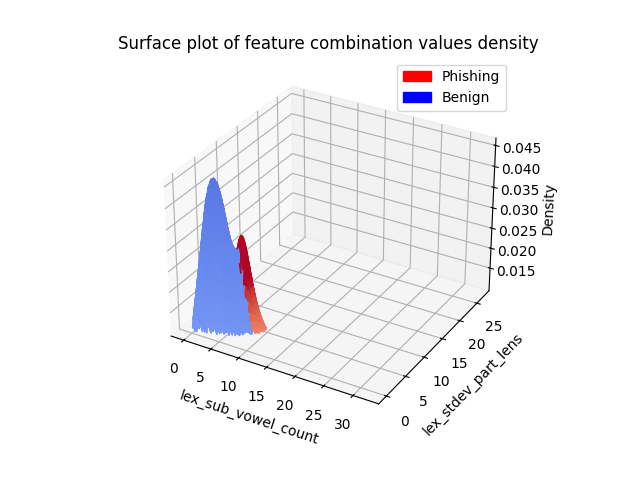

In [21]:
s_benign, s_phishing = data_sample(n=5000)
# Example data (replace this with your actual data)
data_benign = s_benign  # Assuming s_benign contains your benign data
data_phishing = s_phishing  # Assuming s_ph_phishing contains your phishing data

# Define the two columns for the scatter plot
# column_x = 'lex_sub_consonant_ratio'  # Replace with the actual column name
# column_y = 'lex_sub_hex_count' 
"""
"""

column_x, column_y = 'lex_sub_vowel_count', 'lex_stdev_part_lens'

print(f"{column_x}-{column_y}")

x_grid, y_grid, z_masked, origin_mask = column_corelation_difference(column_x, column_y, s_benign, s_phishing)

# Create a 3D surface plot
fig = plt.figure()
ax = fig.add_subplot(111, projection='3d')

# Use the 'origin_mask' for color mapping
cmap = plt.get_cmap('coolwarm')
surf = ax.plot_surface(x_grid, y_grid, z_masked, cmap=cmap, linewidth=1, antialiased=True, facecolors=cmap(origin_mask), rcount=150, ccount=150)

red_patch = mpatches.Patch(color='red', label='Phishing')
blue_patch = mpatches.Patch(color='blue', label='Benign')
plt.legend(handles=[red_patch, blue_patch])

# Add labels and title
ax.set_xlabel(column_x)
ax.set_ylabel(column_y)
ax.set_zlabel('Density')
plt.title('Surface plot of feature combination values density')

# Show the plot
plt.show()

0. dns_dnssec_score, rdap_admin_name_len


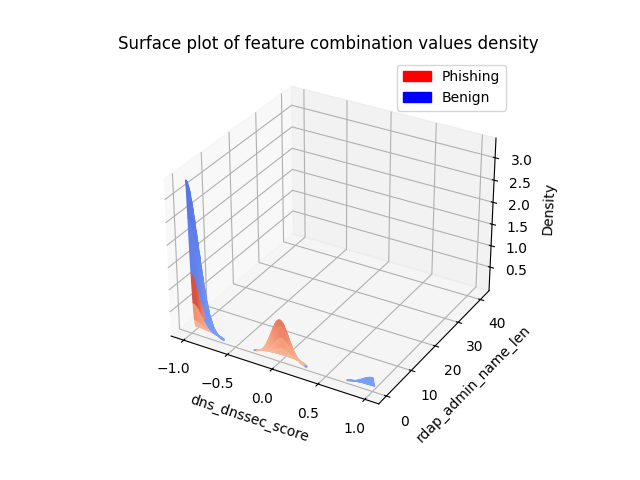

1. dns_mx_avg_len, lex_longest_part_len


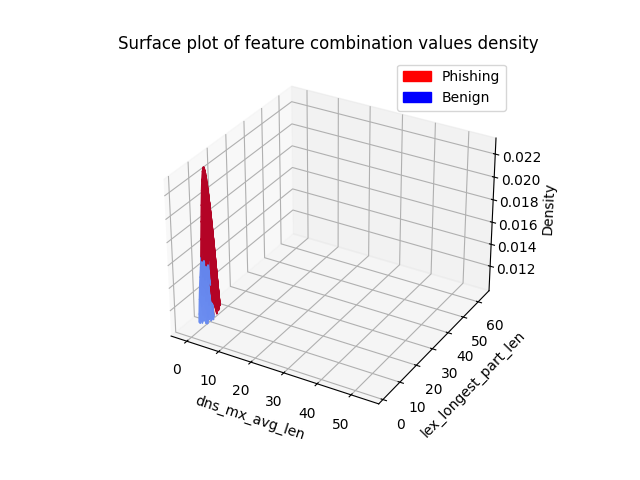

2. dns_soa_email_digit_count, lex_avg_part_len


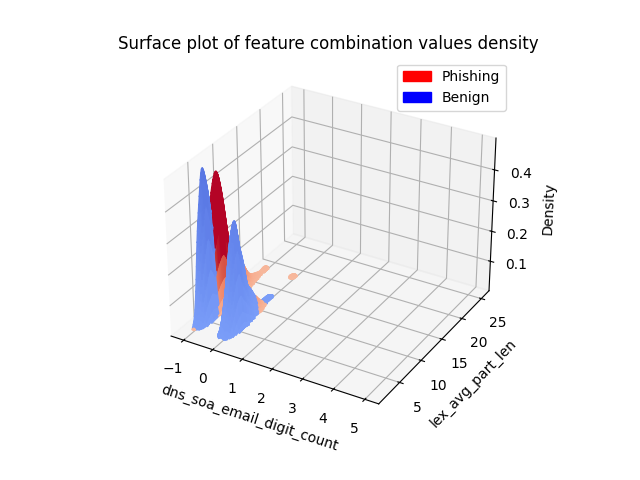

3. dns_soa_email_digit_count, lex_shortest_sub_len


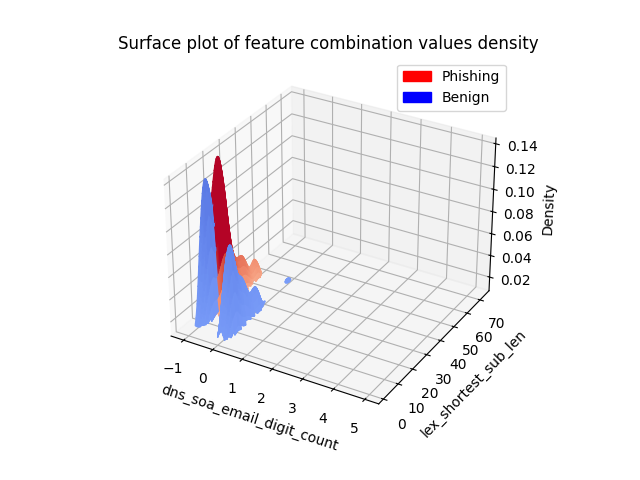

4. dns_soa_email_digit_count, lex_sld_len


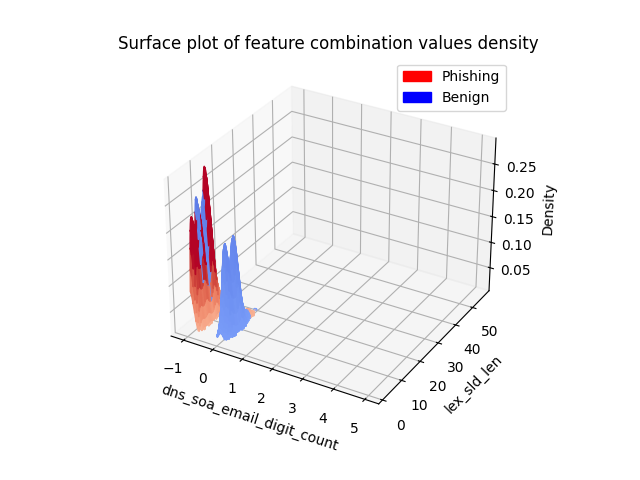

5. dns_soa_email_digit_count, lex_stdev_part_lens


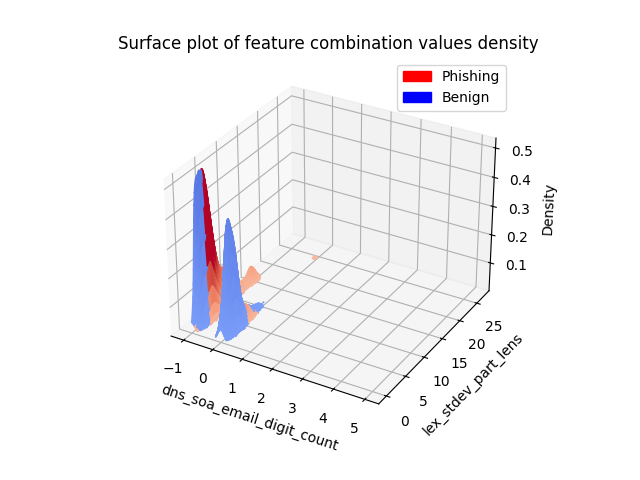

6. dns_soa_email_digit_count, lex_stld_unique_char_count


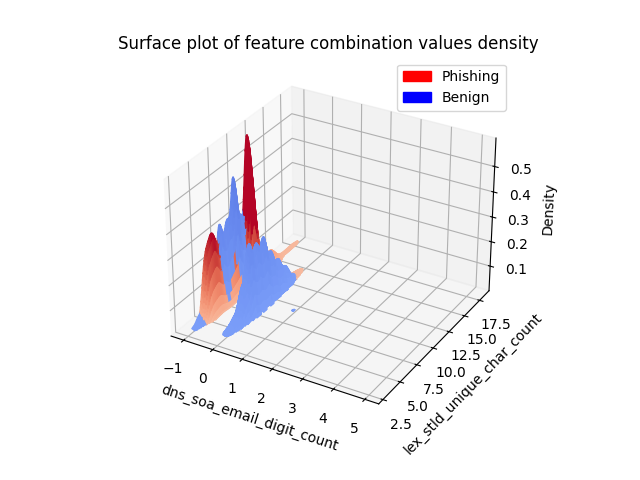

7. dns_soa_email_digit_count, lex_sub_hex_ratio


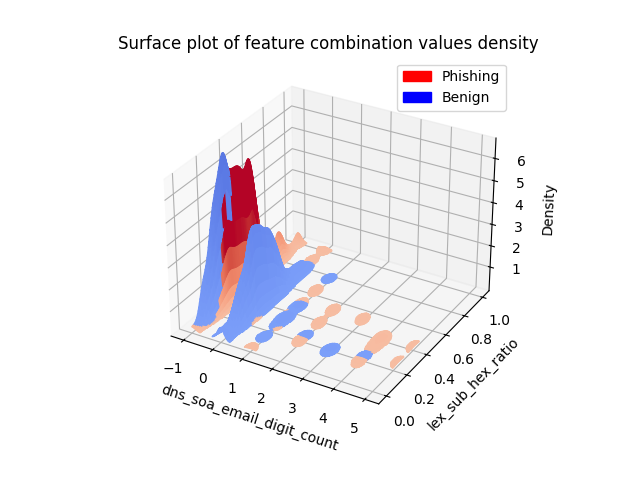

8. dns_soa_email_digit_count, rdap_domain_active_time


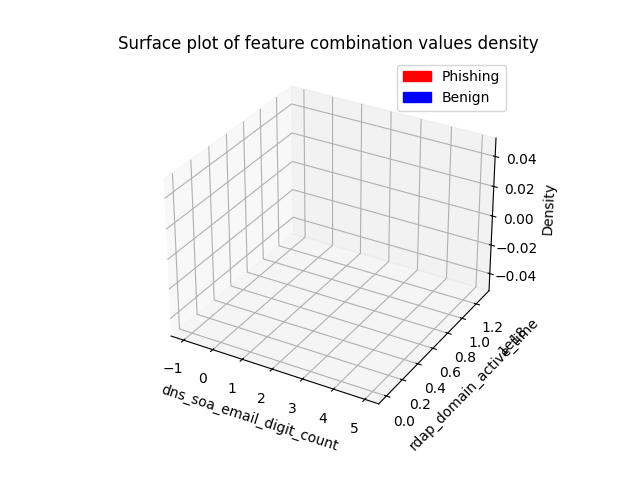

9. dns_soa_email_digit_count, rdap_domain_age


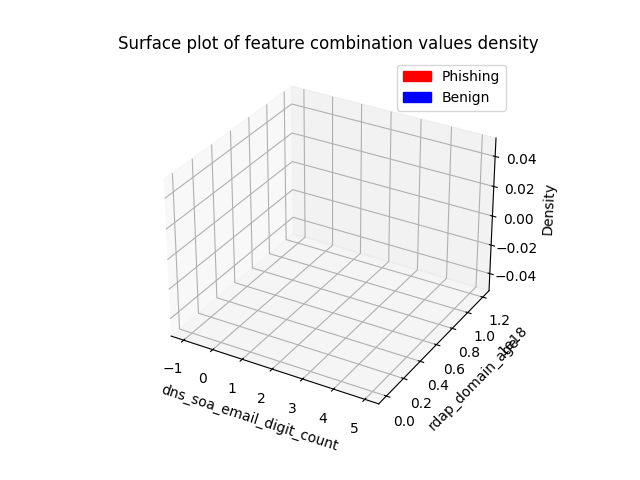

10. dns_soa_email_digit_count, tls_root_cert_lifetime


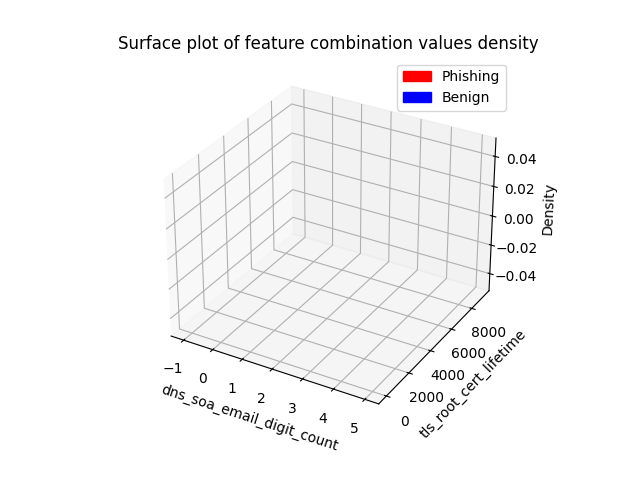

11. dns_soa_email_digit_count, tls_unique_SLD_count


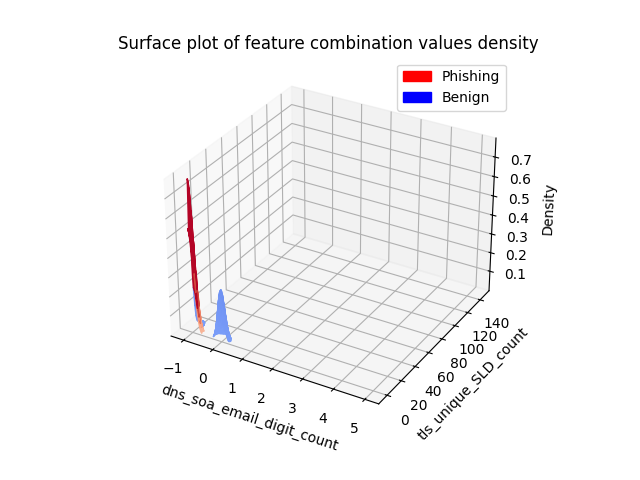

12. dns_soa_email_len, lex_avg_part_len


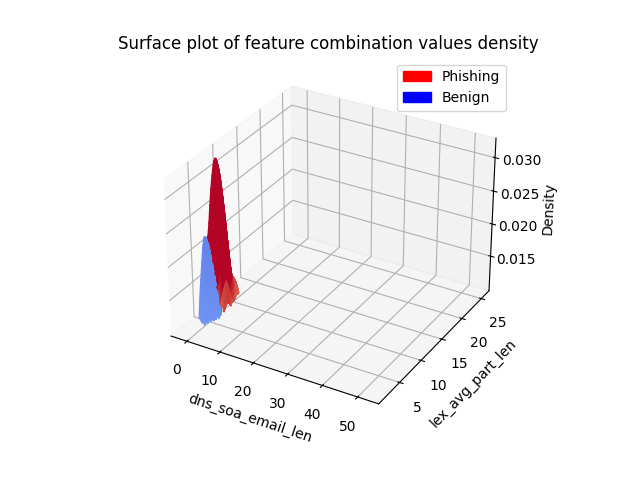

13. dns_soa_email_len, lex_sld_len


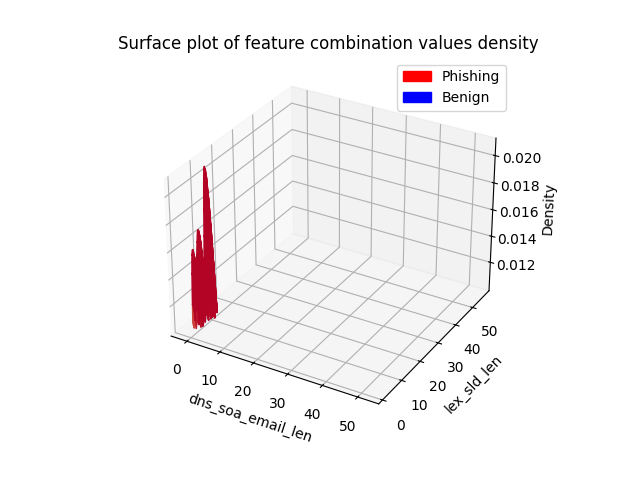

14. dns_soa_primary_ns_entropy, lex_avg_part_len


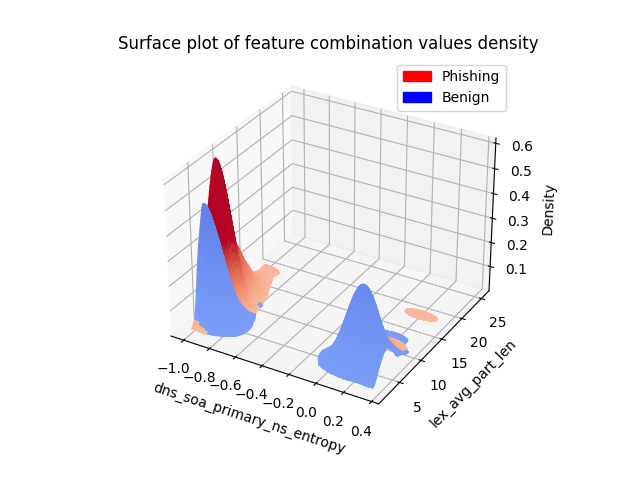

15. dns_soa_primary_ns_len, lex_avg_part_len


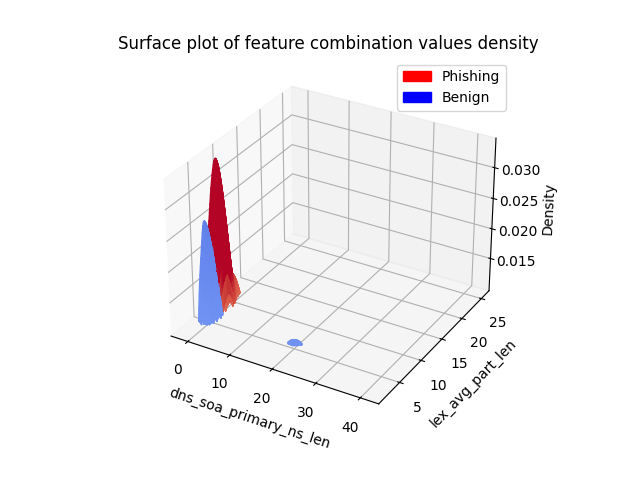

16. dns_soa_primary_ns_len, lex_sld_len


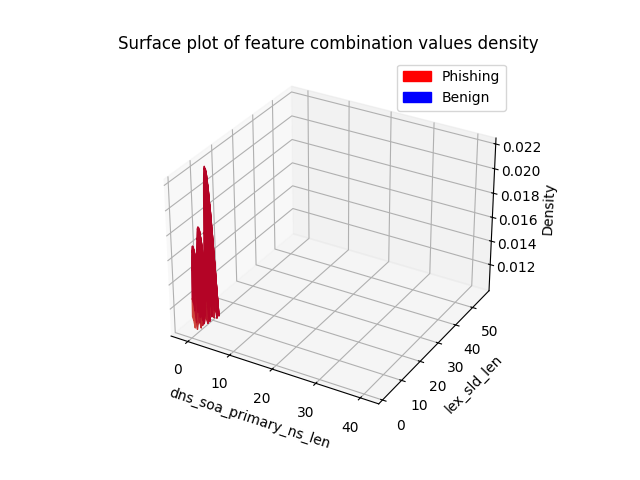

17. dns_soa_refresh, lex_avg_part_len


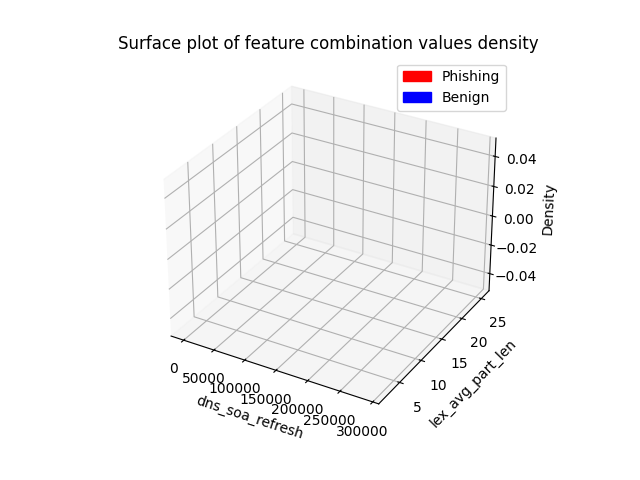

18. dns_soa_refresh, lex_longest_part_len


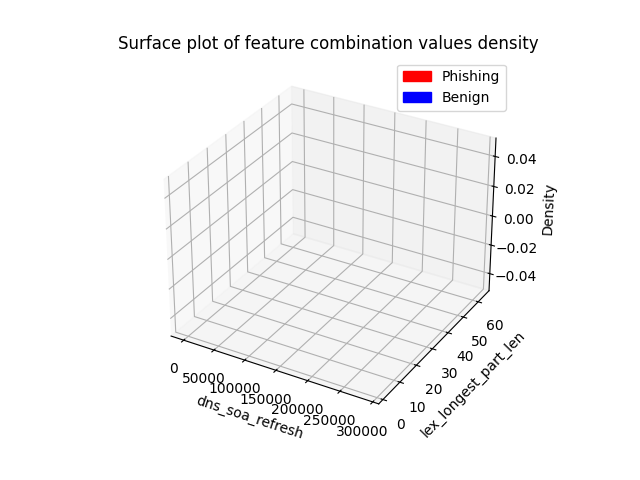

19. dns_soa_refresh, lex_sld_len


C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_8620\2765765108.py:12: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig = plt.figure()


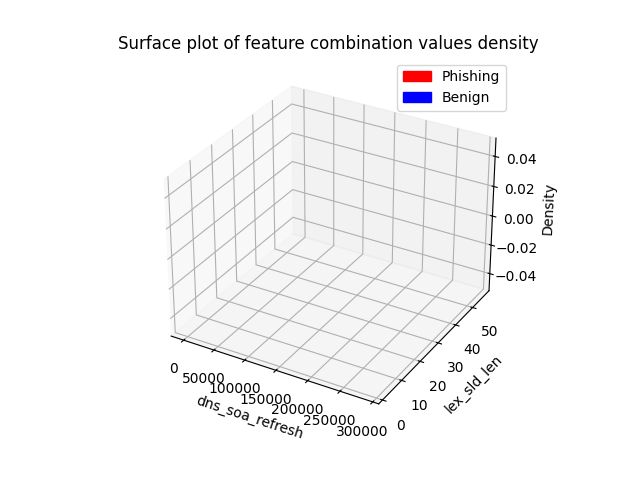

20. dns_soa_refresh, lex_sub_digit_count


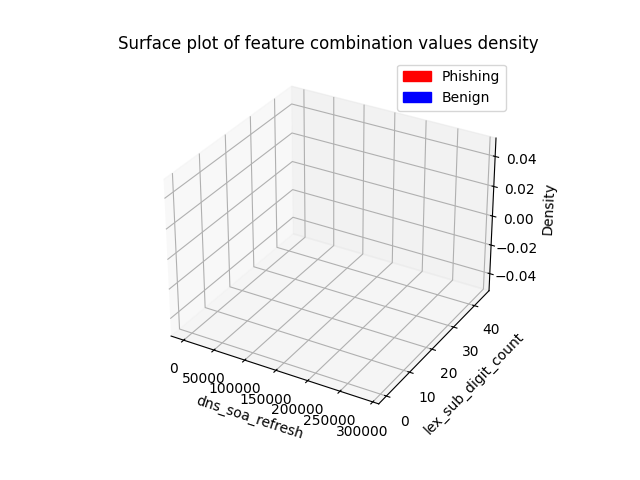

21. dns_soa_refresh, lex_sub_hex_count


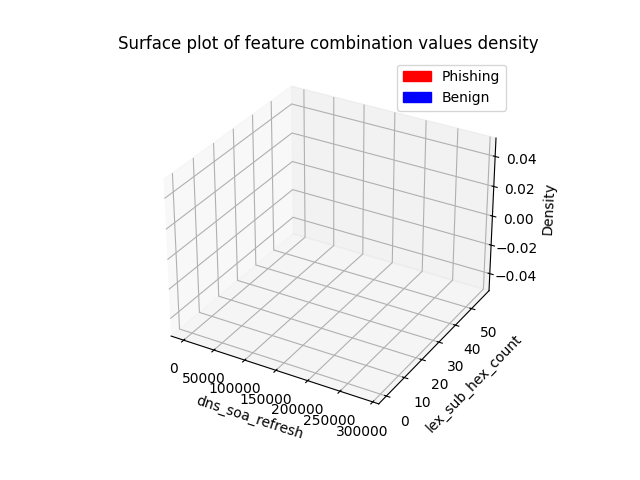

22. dns_ttl_distinct_count, lex_sub_max_consonant_len


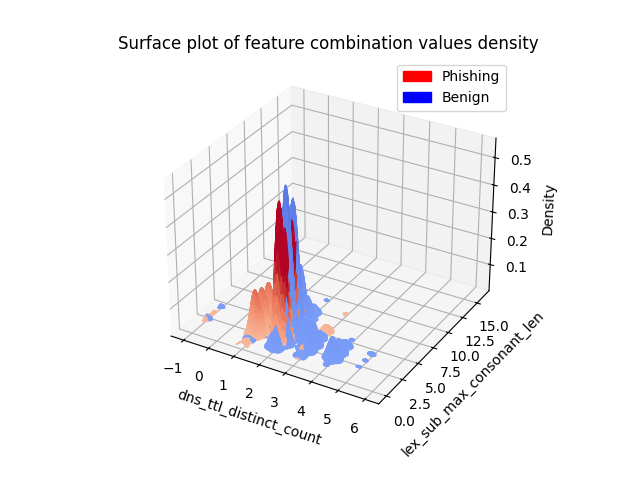

23. dns_ttl_low, lex_avg_part_len


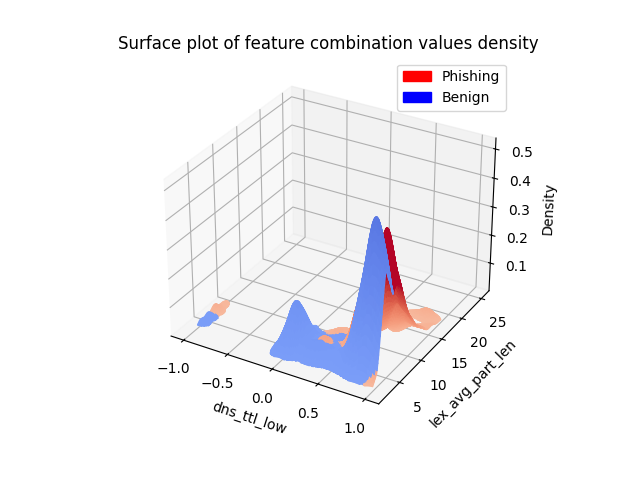

24. dns_ttl_low, lex_sub_digit_count


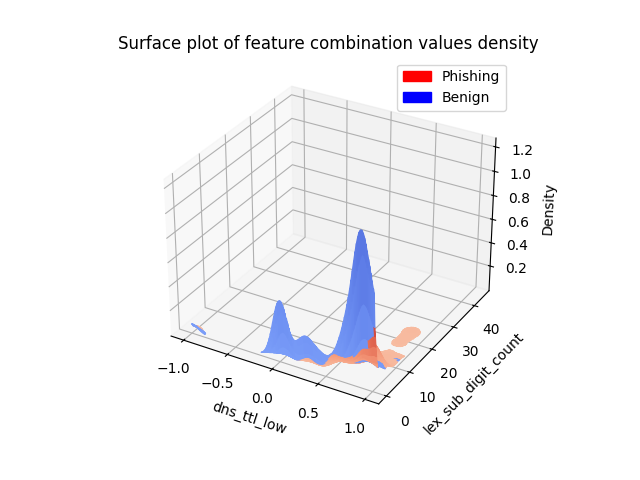

25. dns_ttl_mid, lex_stdev_part_lens


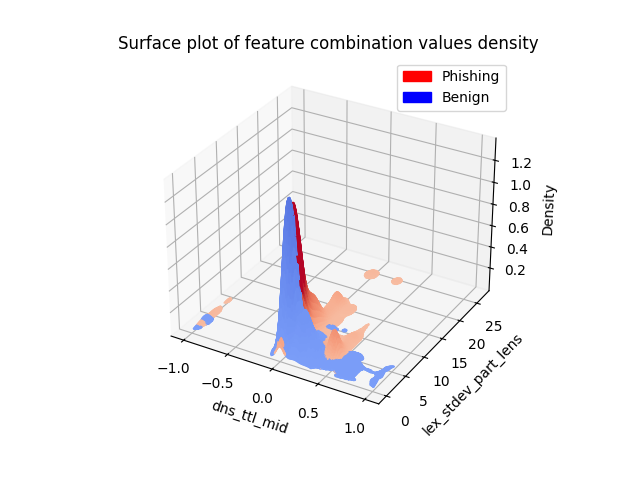

26. dns_ttl_mid, lex_sub_max_consonant_len


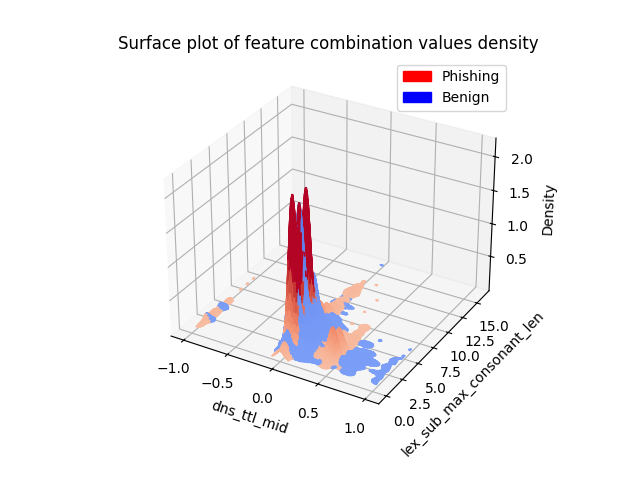

27. dns_txt_avg_entropy, lex_sub_digit_ratio


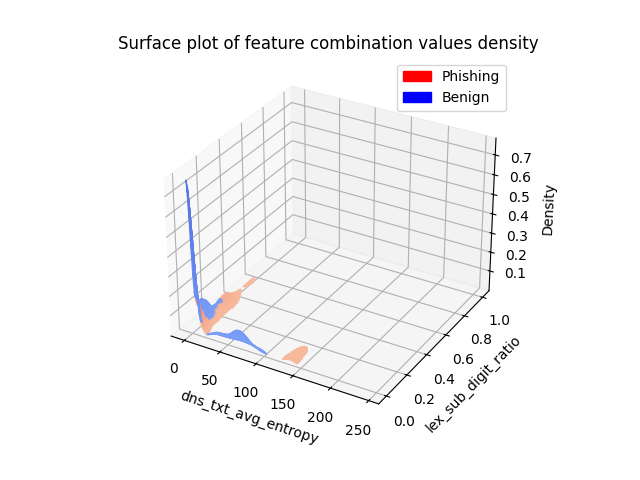

28. dns_txt_avg_entropy, lex_sub_hex_count


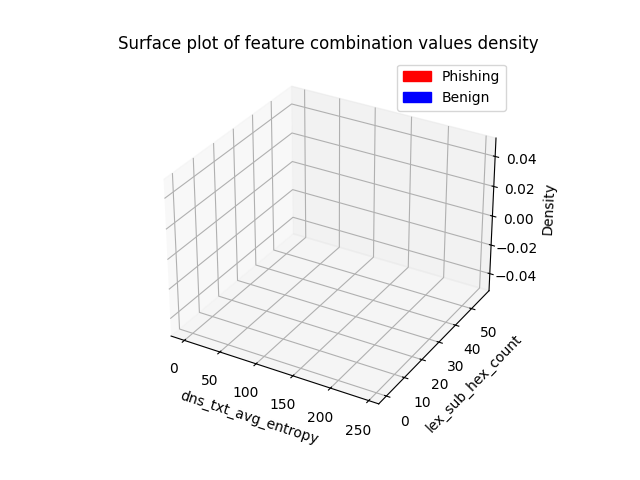

29. dns_txt_avg_entropy, lex_sub_vowel_count


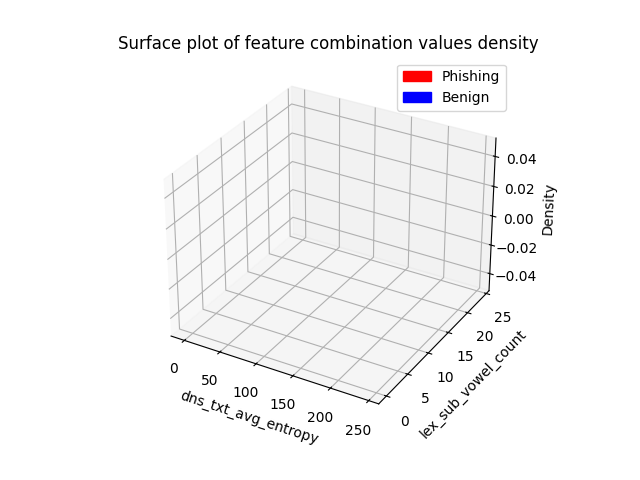

30. dns_txt_dkim_exists, lex_shortest_sub_len


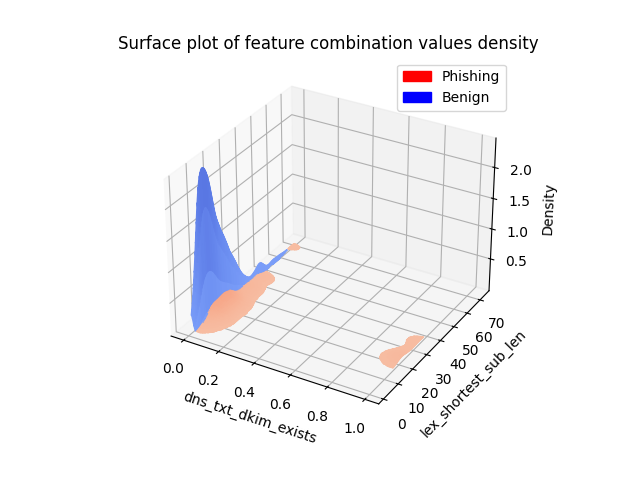

31. dns_txt_dkim_exists, lex_sub_consonant_count


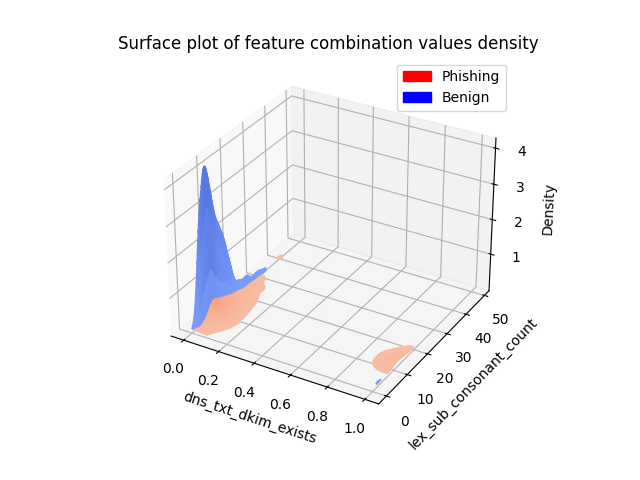

32. dns_txt_dkim_exists, lex_sub_digit_ratio


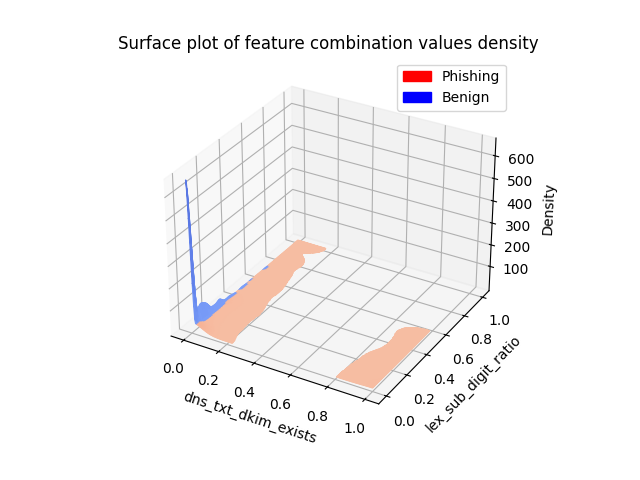

33. dns_txt_external_verification_score, lex_sub_max_consonant_len


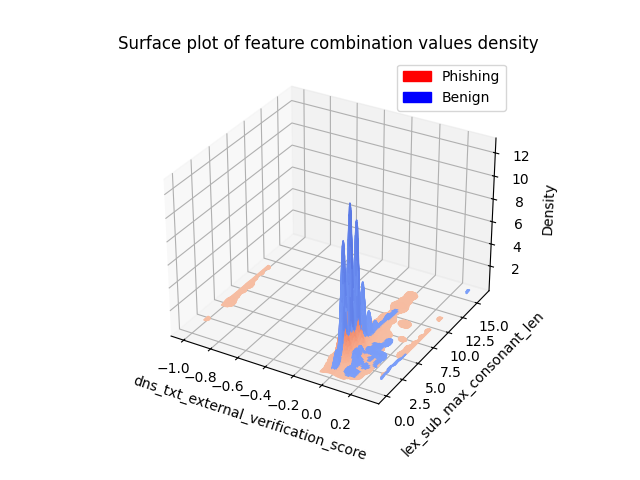

34. dns_txt_external_verification_score, lex_sub_vowel_ratio


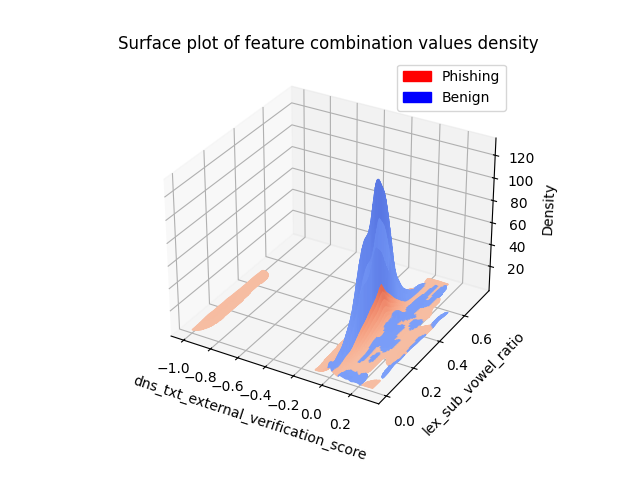

35. dns_txt_spf_exists, lex_sub_consonant_count


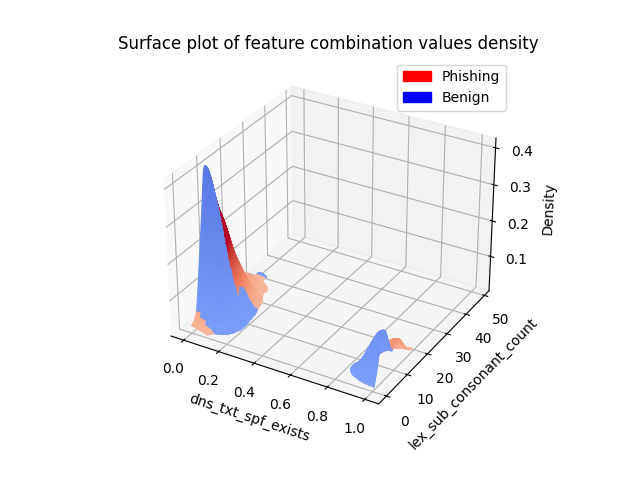

36. dns_zone_entropy, lex_avg_part_len


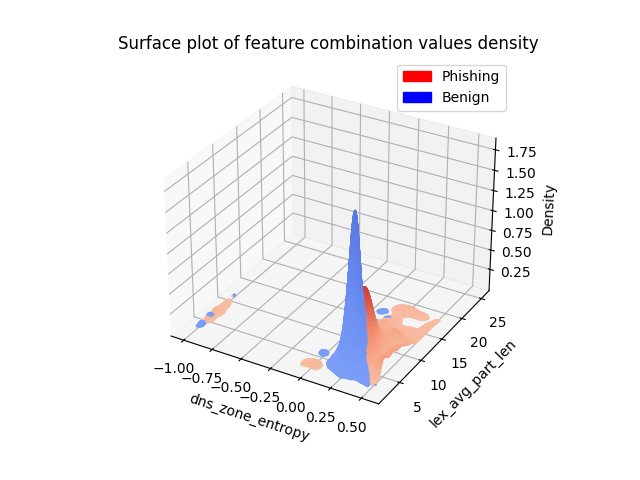

37. dns_zone_entropy, lex_sld_len


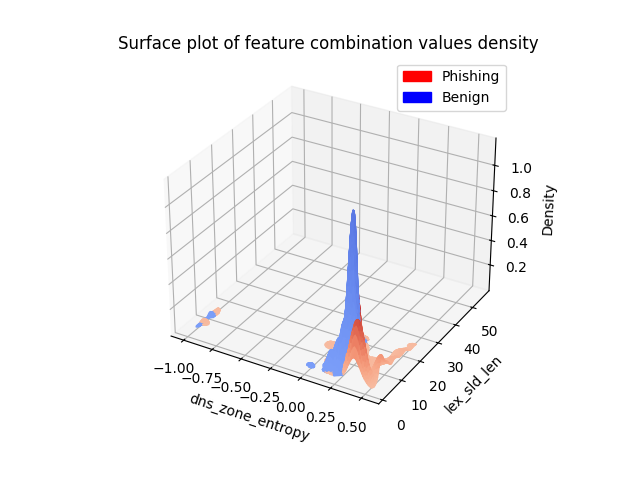

38. dns_zone_entropy, lex_stdev_part_lens


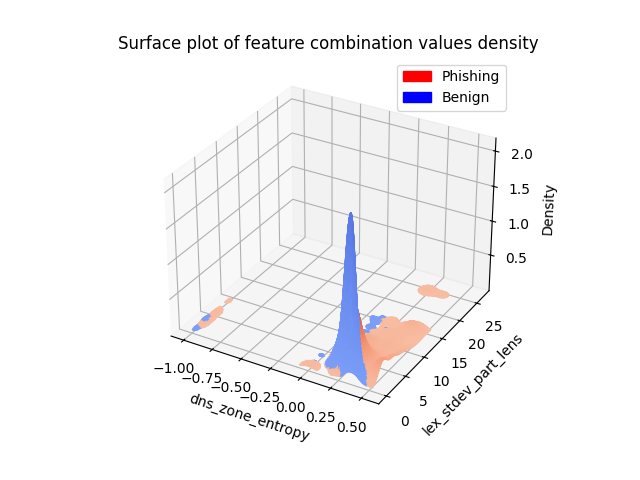

39. dns_zone_entropy, lex_sub_consonant_count


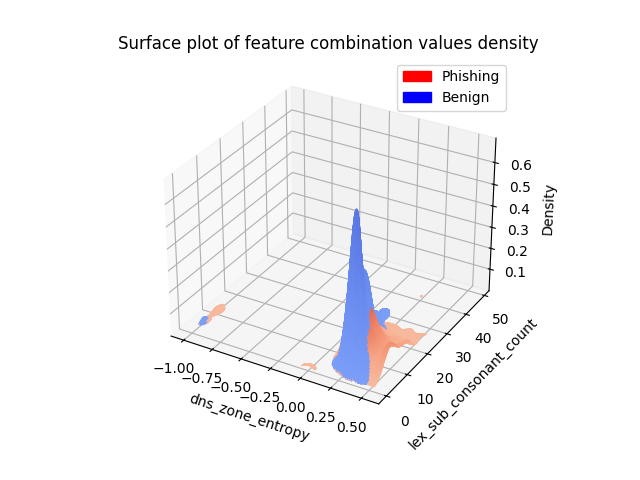

40. dns_zone_entropy, lex_sub_consonant_ratio


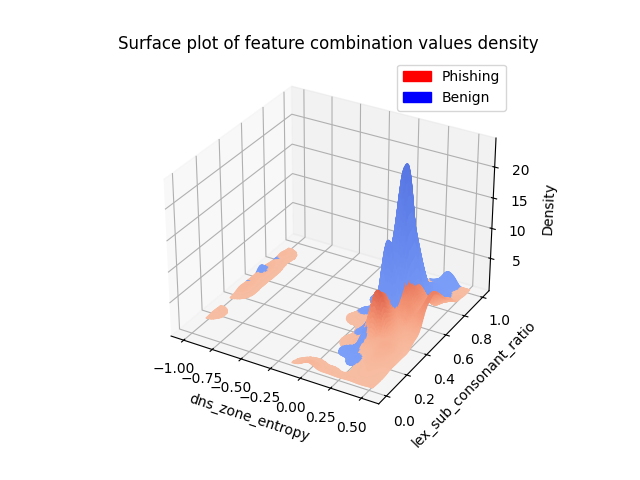

41. dns_zone_entropy, lex_sub_digit_count


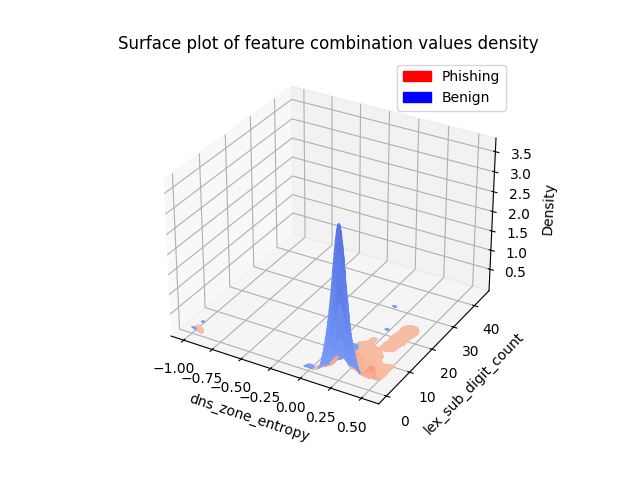

42. dns_zone_entropy, lex_sub_hex_ratio


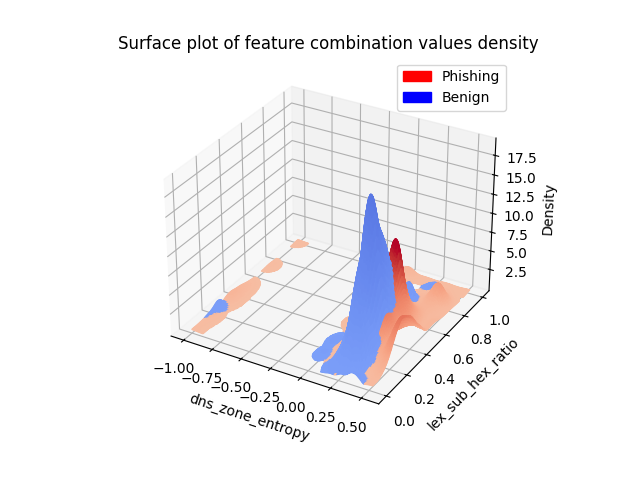

43. dns_zone_entropy, lex_sub_vowel_count


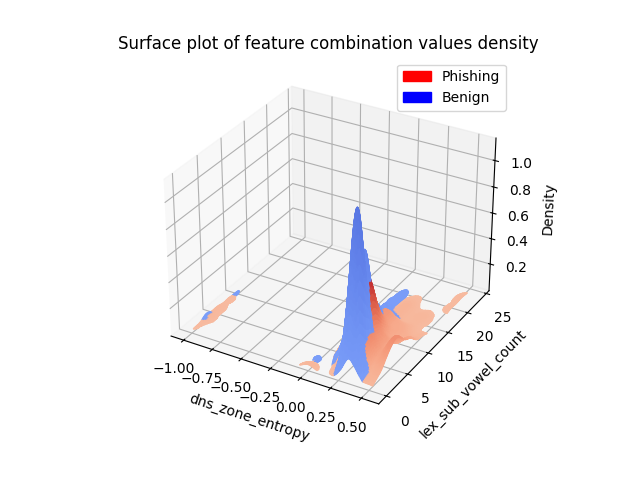

44. dns_zone_entropy, rdap_admin_name_entropy


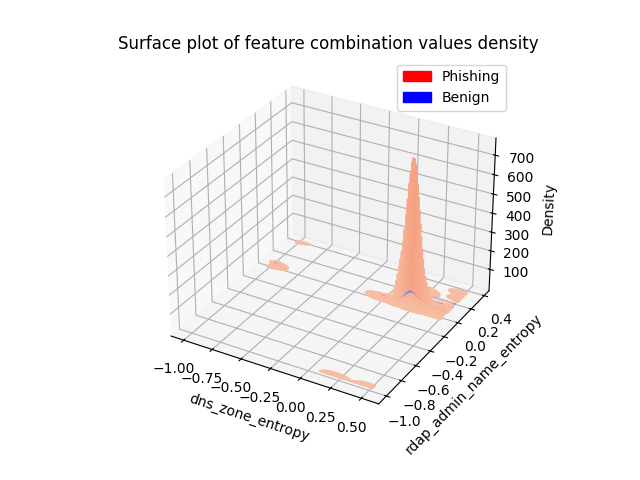

45. dns_zone_len, lex_avg_part_len


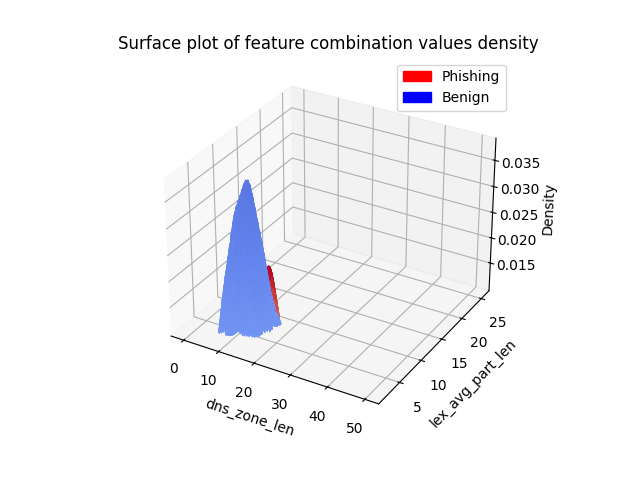

46. dns_zone_len, lex_longest_part_len


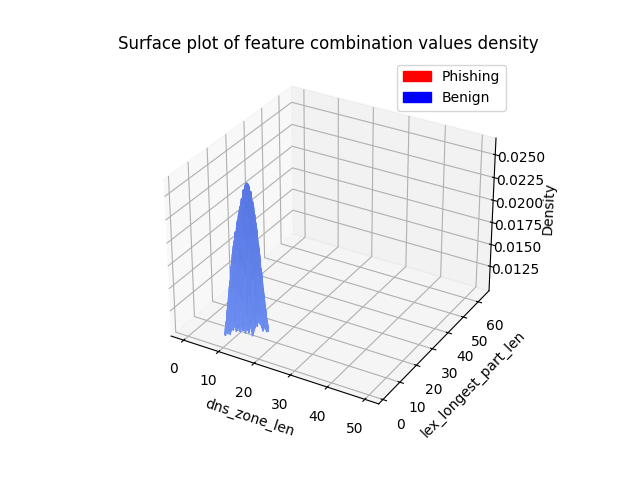

47. dns_zone_len, lex_name_len


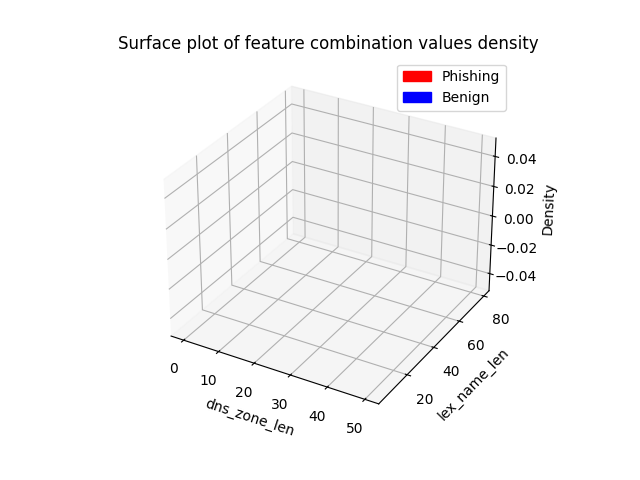

48. dns_zone_len, lex_sld_len


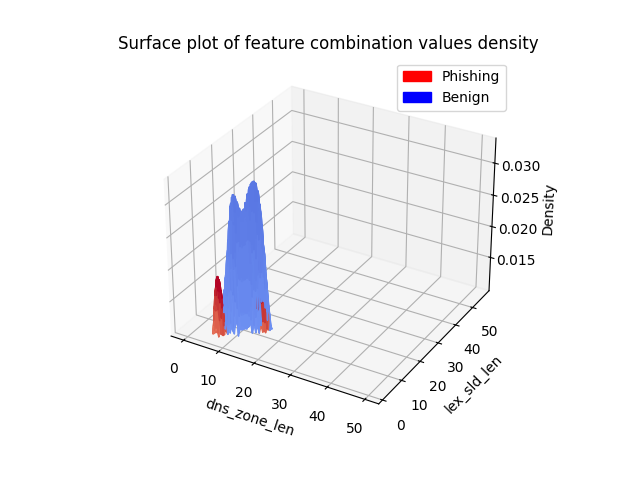

49. dns_zone_len, lex_stdev_part_lens


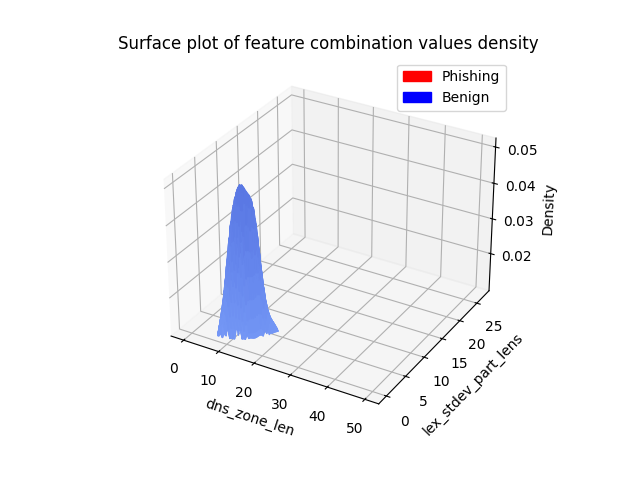

50. dns_zone_len, lex_stld_unique_char_count


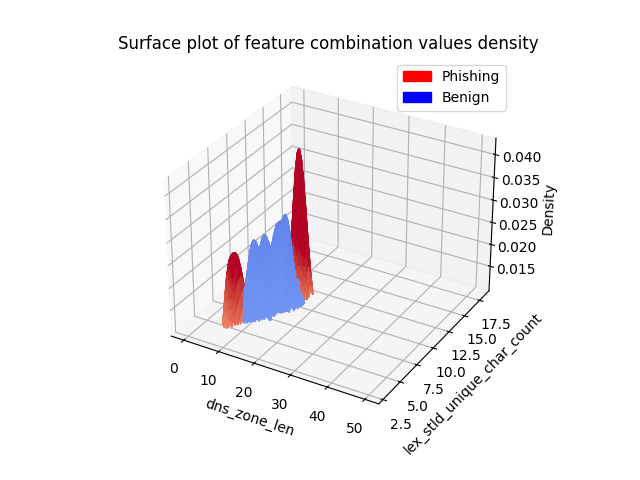

51. dns_zone_len, lex_sub_digit_ratio


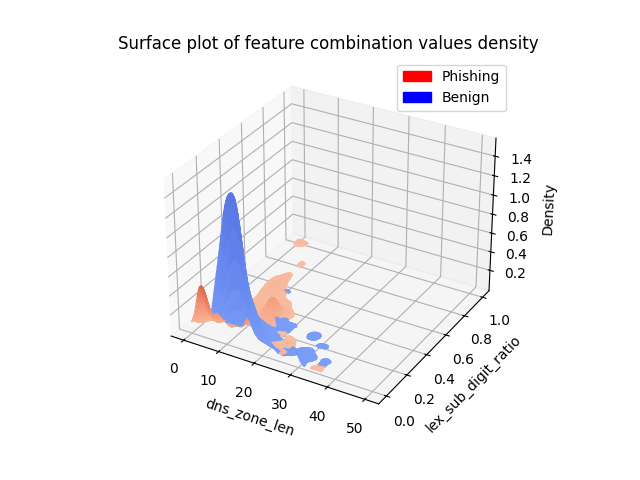

52. dns_zone_len, rdap_admin_name_len


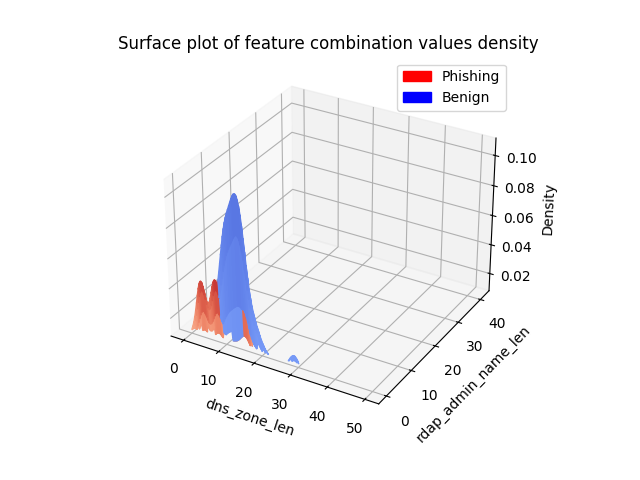

53. dns_zone_len, rdap_registrar_name_hash


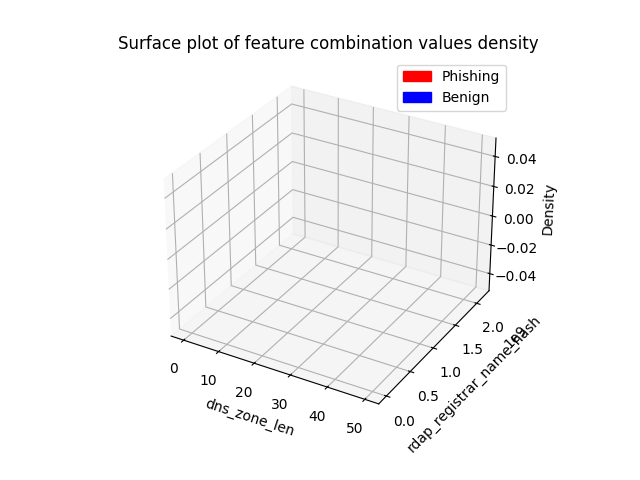

54. ip_mean_average_rtt, lex_sld_len


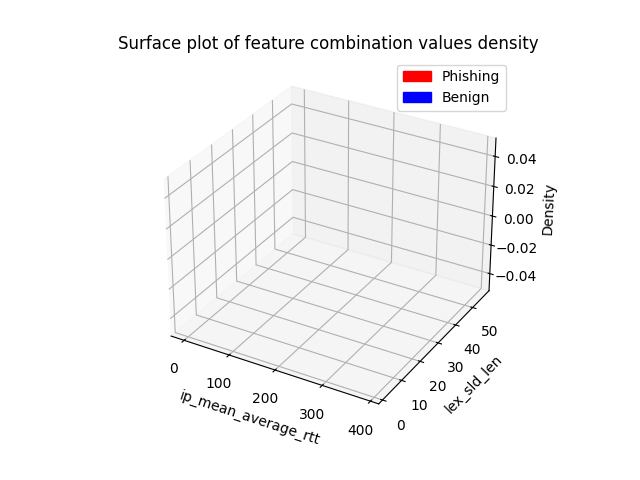

55. ip_mean_average_rtt, lex_stdev_part_lens


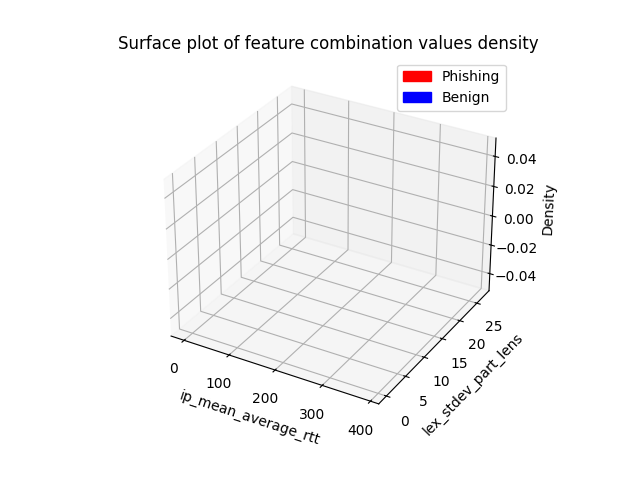

56. lex_avg_part_len, lex_longest_part_len


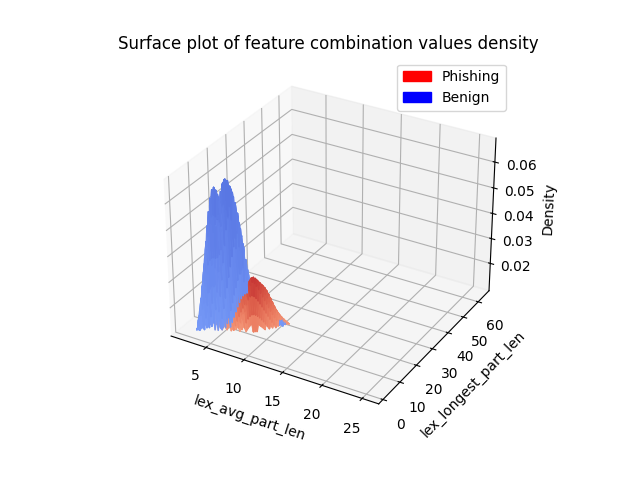

57. lex_avg_part_len, lex_stdev_part_lens


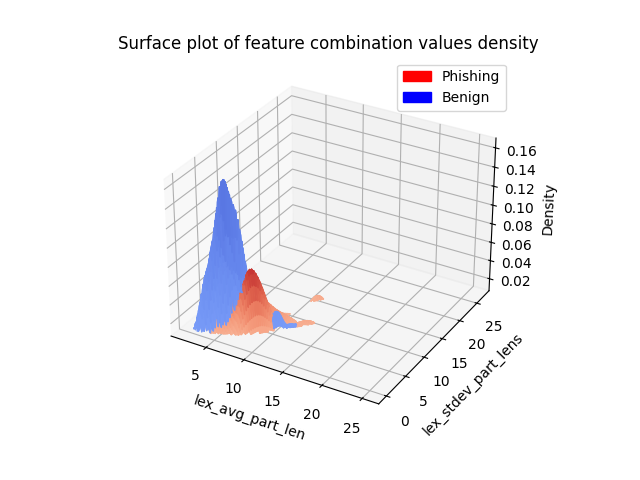

58. lex_avg_part_len, rdap_admin_email_len


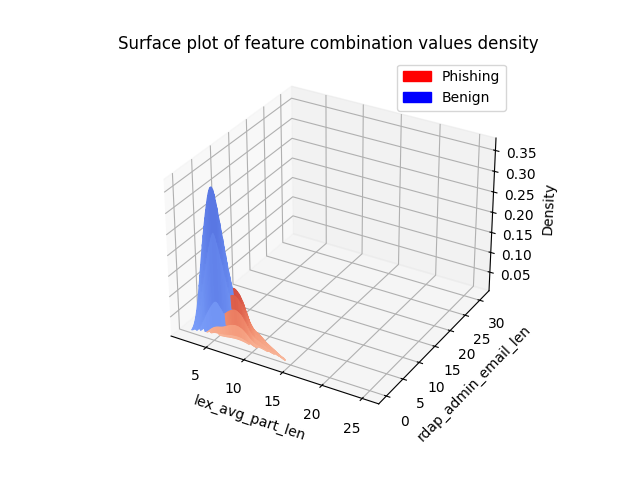

59. lex_avg_part_len, rdap_admin_name_len


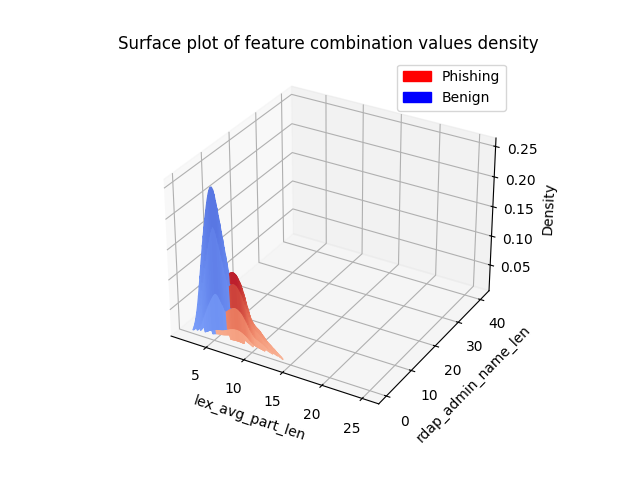

60. lex_avg_part_len, rdap_domain_active_time


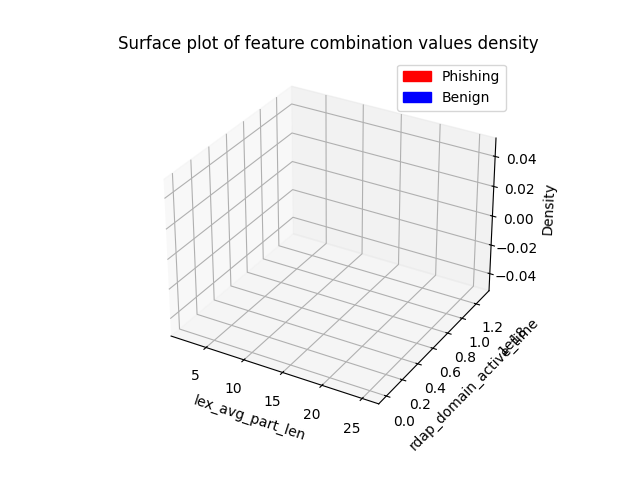

61. lex_avg_part_len, rdap_domain_ag


Traceback (most recent call last):
  File "d:\plocha\skola\fit\research\dr-playground\venv\lib\site-packages\pandas\core\indexes\base.py", line 3790, in get_loc
    return self._engine.get_loc(casted_key)
  File "index.pyx", line 152, in pandas._libs.index.IndexEngine.get_loc
  File "index.pyx", line 181, in pandas._libs.index.IndexEngine.get_loc
  File "pandas\_libs\hashtable_class_helper.pxi", line 7080, in pandas._libs.hashtable.PyObjectHashTable.get_item
  File "pandas\_libs\hashtable_class_helper.pxi", line 7088, in pandas._libs.hashtable.PyObjectHashTable.get_item
KeyError: 'rdap_domain_ag'

The above exception was the direct cause of the following exception:

Traceback (most recent call last):
  File "C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_8620\2765765108.py", line 14, in <module>
    x_grid, y_grid, z_masked, origin_mask = column_corelation_difference(column_a, column_b, s_benign, s_phishing)
  File "C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_8620\547353550.

62. lex_avg_part_len, rdap_ip_avg_admin_email_len


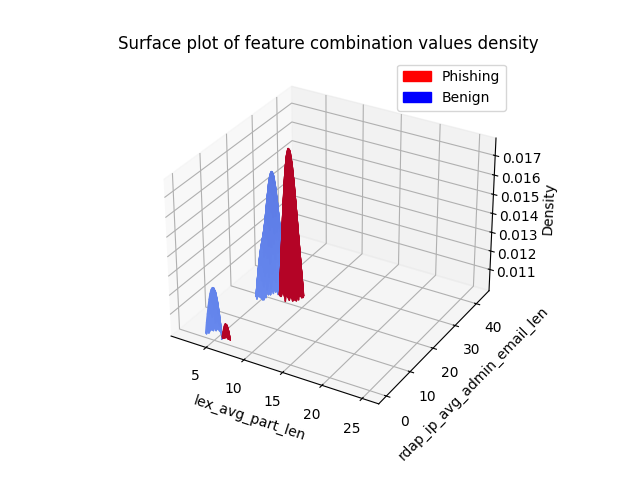

63. lex_avg_part_len, rdap_ip_avg_admin_name_len


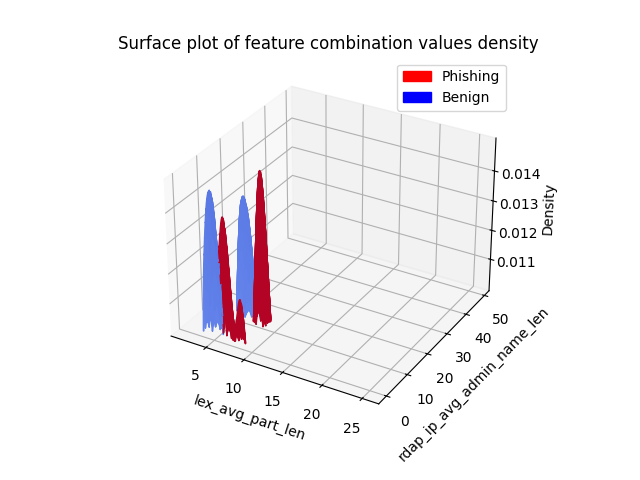

64. lex_avg_part_len, rdap_ip_longest_v4_prefix_len


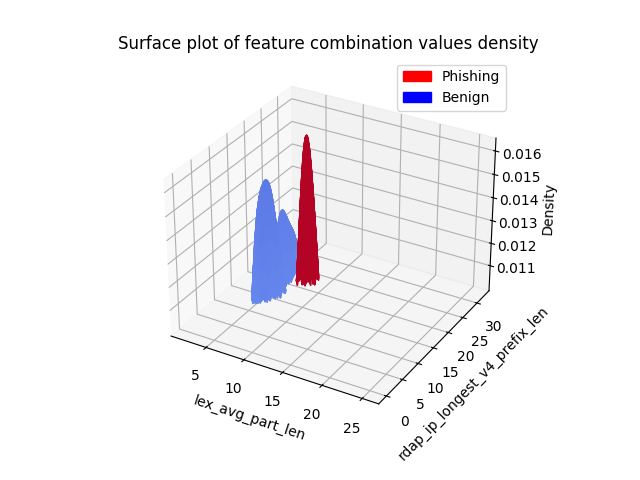

65. lex_avg_part_len, rdap_ip_shortest_v4_prefix_len


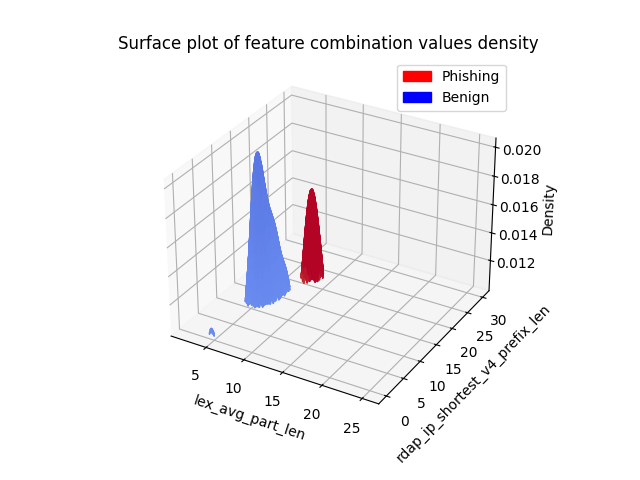

66. lex_avg_part_len, rdap_registrar_name_hash


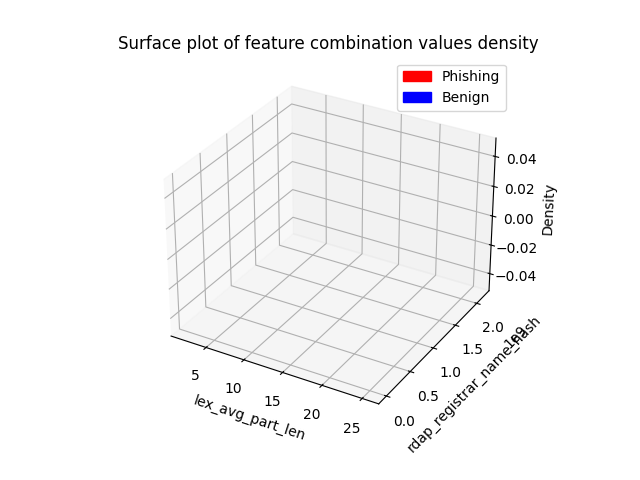

67. lex_avg_part_len, rdap_registrar_name_len


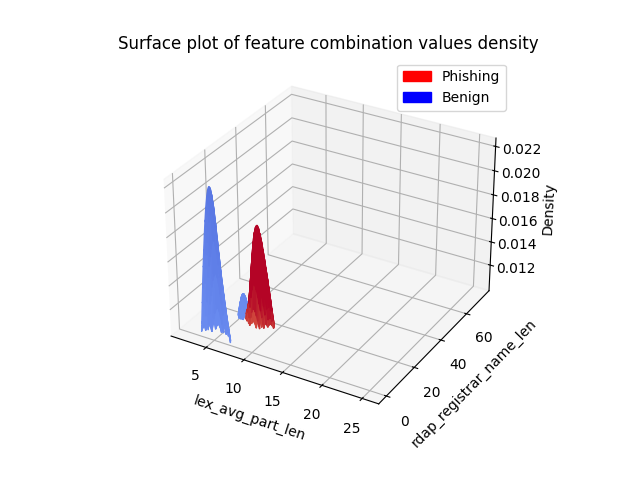

68. lex_avg_part_len, rdap_registration_period


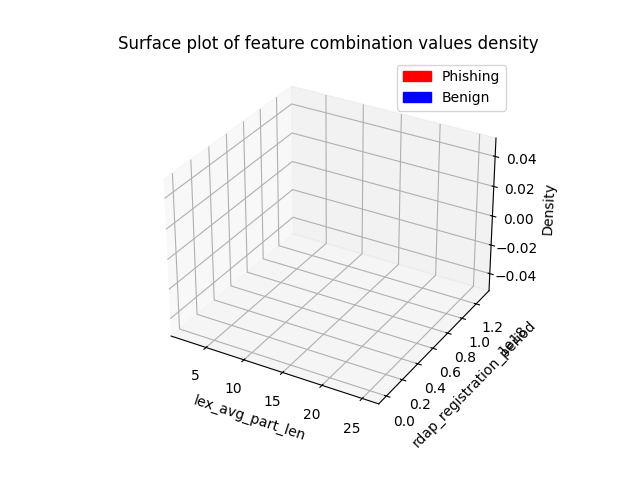

69. lex_bigram_matches, lex_stdev_part_lens


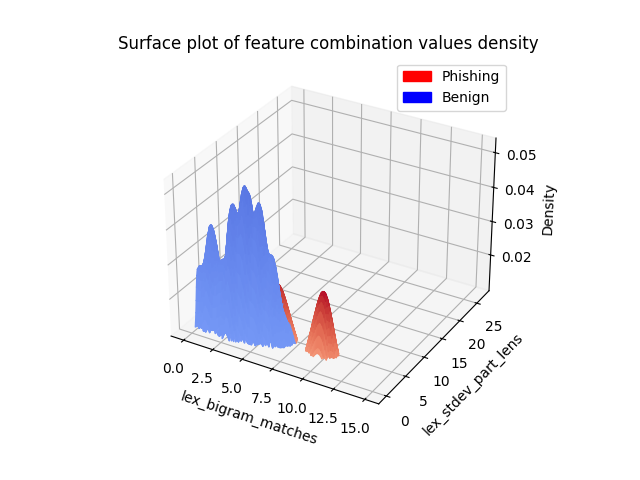

70. lex_consecutive_chars, lex_sub_max_consonant_len


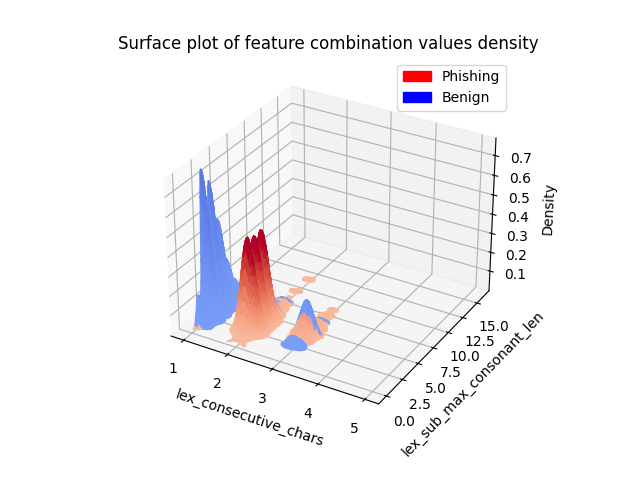

71. lex_consecutive_chars, rdap_domain_active_time


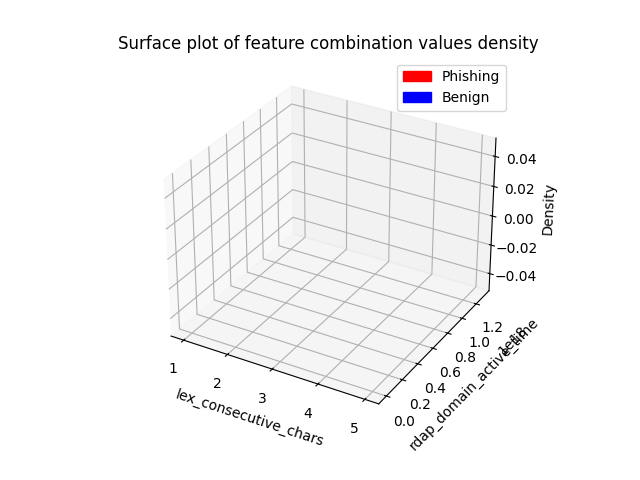

72. lex_consecutive_chars, rdap_domain_age


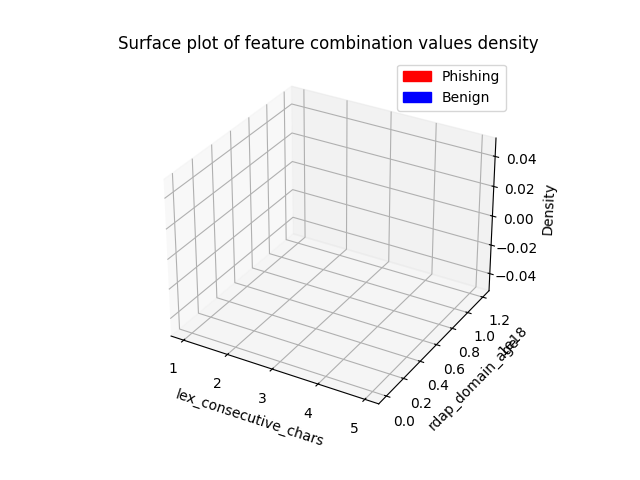

73. lex_consecutive_chars, rdap_registrar_name_hash


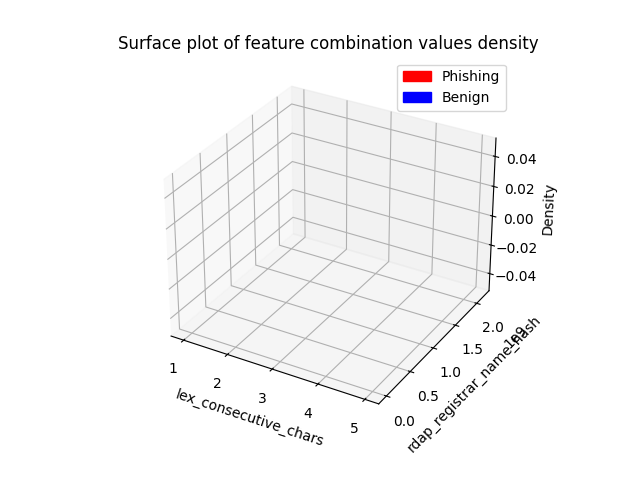

74. lex_consecutive_chars, rdap_registration_period


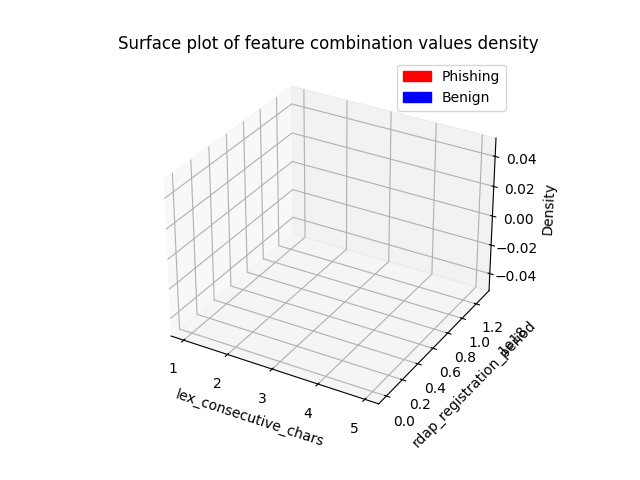

75. lex_longest_part_len, rdap_admin_name_entropy


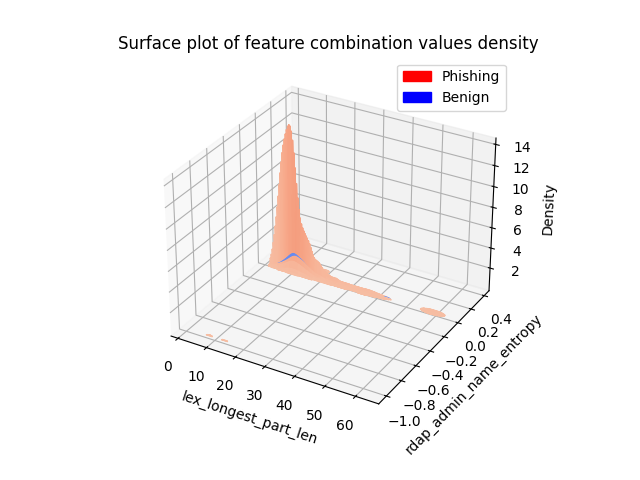

76. lex_longest_part_len, rdap_domain_active_time


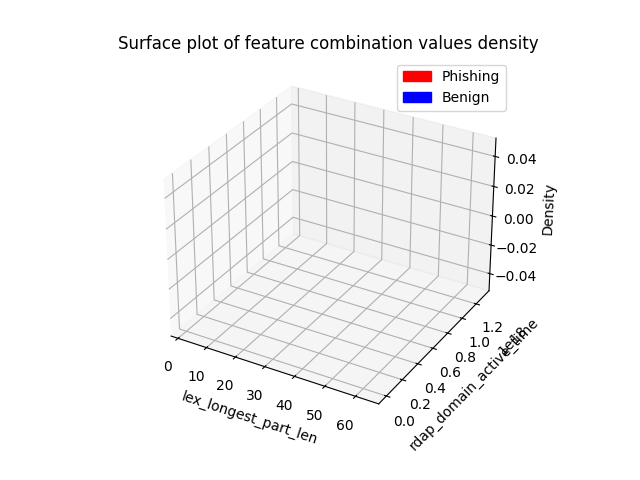

77. lex_longest_part_len, rdap_domain_age


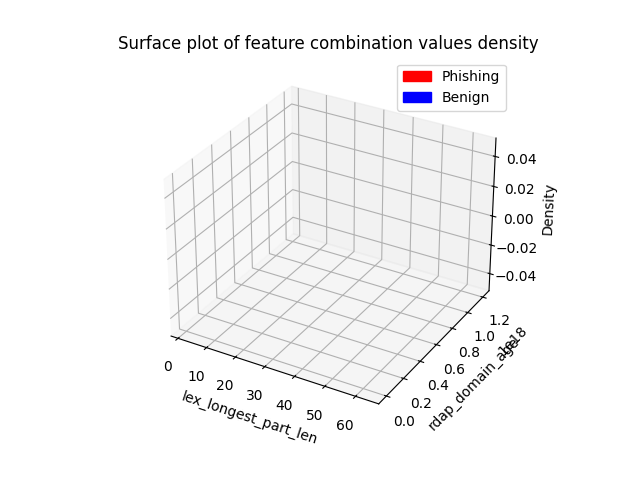

78. lex_longest_part_len, rdap_registrant_name_len


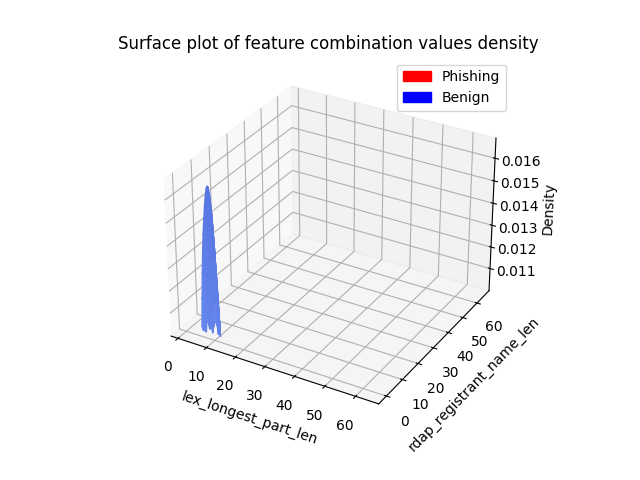

79. lex_longest_part_len, rdap_registration_period


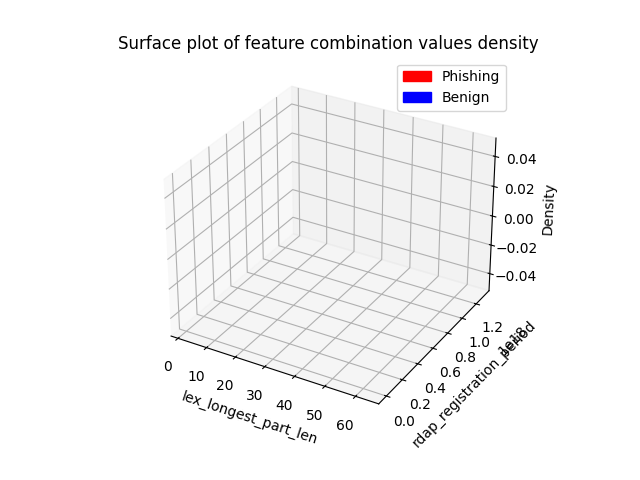

80. lex_name_len, lex_avg_part_len


In [ ]:
import traceback

s_benign, s_phishing = data_sample(n=1000)
# s_benign, s_phishing = benign, phishing


for j, x in enumerate(potential_combinations):
    column_a, column_b = x

    try:
        print(f"{j}. {column_a}, {column_b}")
        fig = plt.figure()
        ax = fig.add_subplot(111, projection='3d')
        x_grid, y_grid, z_masked, origin_mask = column_corelation_difference(column_a, column_b, s_benign, s_phishing)

        cmap = plt.get_cmap('coolwarm')
        surf = ax.plot_surface(x_grid, y_grid, z_masked, cmap=cmap, linewidth=1, antialiased=True, facecolors=cmap(origin_mask), rcount=150, ccount=150)
        
        red_patch = mpatches.Patch(color='red', label='Phishing')
        blue_patch = mpatches.Patch(color='blue', label='Benign')
        plt.legend(handles=[red_patch, blue_patch])
        # Add labels and title
        ax.set_xlabel(column_a)
        ax.set_ylabel(column_b)
         ax.set_zlabel('Density')
        plt.title('Surface plot of feature combination values density')
        plt.show()
    except:
        traceback.print_exc()


In [24]:
import traceback

s_benign, s_phishing = data_sample(n=35000)
# s_benign, s_phishing = benign, phishing


for j, x in enumerate(potential_combinations):
    column_a, column_b = x

    try:
        plt.scatter(s_phishing[column_a], s_phishing[column_b], label="phishing", c="red", marker="o")
        plt.scatter(s_benign[column_a], s_benign[column_b], label="benign", c="blue", marker="x")
        # sns.kdeplot(data=s_benign, x=column_a, y=column_b, fill=True, label="benign",)
        # sns.kdeplot(data=s_phishing, x=column_a, y=column_b, fill=True, label="phishing")
        # plt.contourf(x, y, density_df2, cmap='viridis')
        plt.xlabel(column_a)
        plt.ylabel(column_b)
        plt.legend()
        plt.savefig(f"images/combinations-full/{column_a}-{column_b}.png", bbox_inches='tight')
        plt.close()
        print(f"{j}. {column_a}, {column_b}")

        
    except:
        traceback.print_exc()


C:\Users\Tomas Foltyn\AppData\Local\Temp\ipykernel_12344\4155273604.py:19: UserWarning: Creating legend with loc="best" can be slow with large amounts of data.
  plt.savefig(f"images/combinations-full/{column_a}-{column_b}.png", bbox_inches='tight')


0. dns_dnssec_score, rdap_admin_name_len
1. dns_mx_avg_len, lex_longest_part_len
2. dns_soa_email_digit_count, lex_avg_part_len
3. dns_soa_email_digit_count, lex_shortest_sub_len
4. dns_soa_email_digit_count, lex_sld_len
5. dns_soa_email_digit_count, lex_stdev_part_lens
6. dns_soa_email_digit_count, lex_stld_unique_char_count
7. dns_soa_email_digit_count, lex_sub_hex_ratio
8. dns_soa_email_digit_count, rdap_domain_active_time
9. dns_soa_email_digit_count, rdap_domain_age
10. dns_soa_email_digit_count, tls_root_cert_lifetime
11. dns_soa_email_digit_count, tls_unique_SLD_count
12. dns_soa_email_len, lex_avg_part_len
13. dns_soa_email_len, lex_sld_len
14. dns_soa_primary_ns_entropy, lex_avg_part_len
15. dns_soa_primary_ns_len, lex_avg_part_len
16. dns_soa_primary_ns_len, lex_sld_len
17. dns_soa_refresh, lex_avg_part_len
18. dns_soa_refresh, lex_longest_part_len
19. dns_soa_refresh, lex_sld_len
20. dns_soa_refresh, lex_sub_digit_count
21. dns_soa_refresh, lex_sub_hex_count
22. dns_ttl_dist

In [27]:
import os

top20_dir_path = "images/combinations-full-filtered-top20-area"
top20area = [file.split(".png")[0].split("-") for file in os.listdir(top20_dir_path)]

top20area

[['dns_zone_len', 'lex_avg_part_len'],
 ['lex_avg_part_len', 'lex_stdev_part_lens'],
 ['lex_avg_part_len', 'rdap_registrar_name_len'],
 ['lex_longest_part_len', 'rdap_domain_age'],
 ['lex_name_len', 'lex_sub_consonant_ratio'],
 ['lex_name_len', 'lex_sub_digit_count'],
 ['lex_name_len', 'lex_sub_digit_ratio'],
 ['lex_sld_len', 'lex_sub_hex_ratio'],
 ['lex_stdev_part_lens', 'lex_shortest_sub_len'],
 ['lex_stdev_part_lens', 'rdap_registrar_name_hash'],
 ['lex_sub_consonant_count', 'lex_stdev_part_lens'],
 ['lex_sub_consonant_count', 'lex_sub_hex_ratio'],
 ['lex_sub_consonant_ratio', 'lex_stdev_part_lens'],
 ['lex_sub_digit_count', 'lex_stdev_part_lens'],
 ['lex_sub_digit_count', 'lex_sub_consonant_ratio'],
 ['lex_sub_digit_count', 'lex_sub_digit_ratio'],
 ['lex_sub_digit_ratio', 'lex_longest_part_len'],
 ['lex_sub_hex_ratio', 'lex_stdev_part_lens'],
 ['lex_sub_max_consonant_len', 'lex_avg_part_len'],
 ['lex_sub_vowel_count', 'lex_stdev_part_lens']]